In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/7541.json
/kaggle/input/7534.json
/kaggle/input/23.json
/kaggle/input/4.json
/kaggle/input/8652.json
/kaggle/input/7584.json
/kaggle/input/7583.json
/kaggle/input/7530.json
/kaggle/input/7537.json
/kaggle/input/40.json
/kaggle/input/7561.json
/kaggle/input/38.json
/kaggle/input/8656.json
/kaggle/input/26.json
/kaggle/input/2.json
/kaggle/input/7548.json
/kaggle/input/42.json
/kaggle/input/7568.json
/kaggle/input/7525.json
/kaggle/input/competitions.json
/kaggle/input/3.json
/kaggle/input/7555.json
/kaggle/input/7533.json
/kaggle/input/8649.json
/kaggle/input/7576.json
/kaggle/input/7565.json
/kaggle/input/37.json
/kaggle/input/7553.json
/kaggle/input/22.json
/kaggle/input/39.json
/kaggle/input/7586.json
/kaggle/input/7556.json
/kaggle/input/7544.json
/kaggle/input/7582.json
/kaggle/input/8657.json
/kaggle/input/7577.json
/kaggle/input/25.json
/kaggle/input/8655.json
/kaggle/input/7580.json
/kaggle/input/7560.json
/kaggle/input/7579.json
/kaggle/input/7543.json
/kaggle/inp

In [2]:
import os
import json
import pandas as pd
from pandas import json_normalize

# Directory where all JSON files are stored
dataset_dir = '/kaggle/input'

# List all JSON files (excluding competitions.json)
all_files = [
    f for f in os.listdir(dataset_dir) 
    if f.endswith('.json') and f != 'competitions.json'
]

# Extract match metadata from event files (if needed)
all_matches = []
for file in all_files:
    file_path = os.path.join(dataset_dir, file)
    with open(file_path, 'r', encoding='utf-8') as f:
        events = json.load(f)
        # Only proceed if the JSON contains at least one event with 'match'
        if events and 'match' in events[0]:
            match_info = events[0]['match']
            all_matches.append(match_info)

# Convert list of match info into a Pandas DataFrame
df_matches = json_normalize(all_matches)
print(df_matches.head())


Empty DataFrame
Columns: []
Index: []


In [3]:
pip install mplsoccer


Note: you may need to restart the kernel to use updated packages.


# **Player Selection and Match Analysis**

## **Features**
- Lists all players in the match, allowing the user to select one.
- Displays **statistics** for the selected player.
- Plots the **shot map** of the selected player.
- Plots the **pass map** of the selected player.
- Shows **match summary statistics**.

## **How It Works**
- First, you will see a list of players in the match.
- You will be asked to select a player.
- The selected player's analysis will be displayed.

## **Custom Match Selection**
- You can analyze a different match by providing another **match ID**.
- We can use one of the available match IDs from the dataset.
- Which match would you like to analyze?


Loading data...
Tournament data loaded.
Match data loaded.

Players in the match:
- Abdalla Mahmoud El Said Bekhit
- Ahmed Hegazi
- Ahmed Fathy Abdel Meneim Ibrahim
- Aleksandr Golovin
- Mohamed Naser Elsayed Elneny
- Mohamed Salah
- Denis Cheryshev
- Ali Gabr
- Artem Dzyuba
- Mohamed Abdul Shafy Sayed Abouezeid
- Mahmoud Ibrahim Hassan
- Mário Figueira Fernandes
- Marwan Mohsen
- Ilya Kutepov
- Roman Zobnin
- Yuri Zhirkov
- Tarek Hamed
- Aleksandr Samedov
- Mohamed El Shenawy
- Sergei Ignashevich
- Yury Gazinskiy
- Igor Akinfeev
- Amr Medhat Warda
- Ramadan Sobhi
- Daler Kuzyaev
- Fyodor Smolov
- Mahmoud Abdul Monem Abdelhamid Soliman
- Fedor Kudryashov

Randomly selected player: Amr Medhat Warda

Amr Medhat Warda Statistics:
{
  "shots": 1,
  "goals": 0,
  "passes": 20,
  "pass_accuracy": 50.0
}


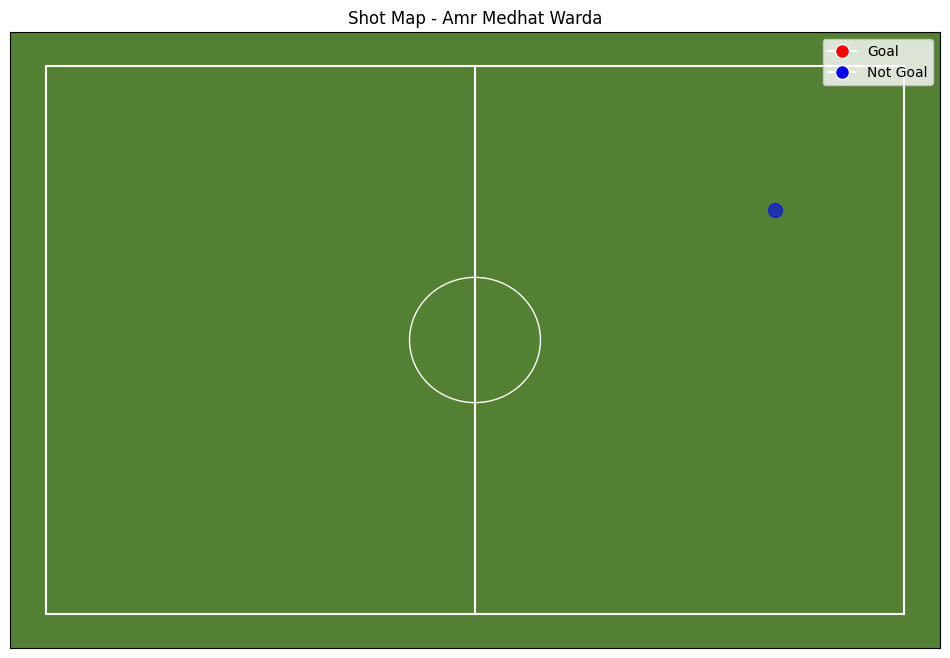

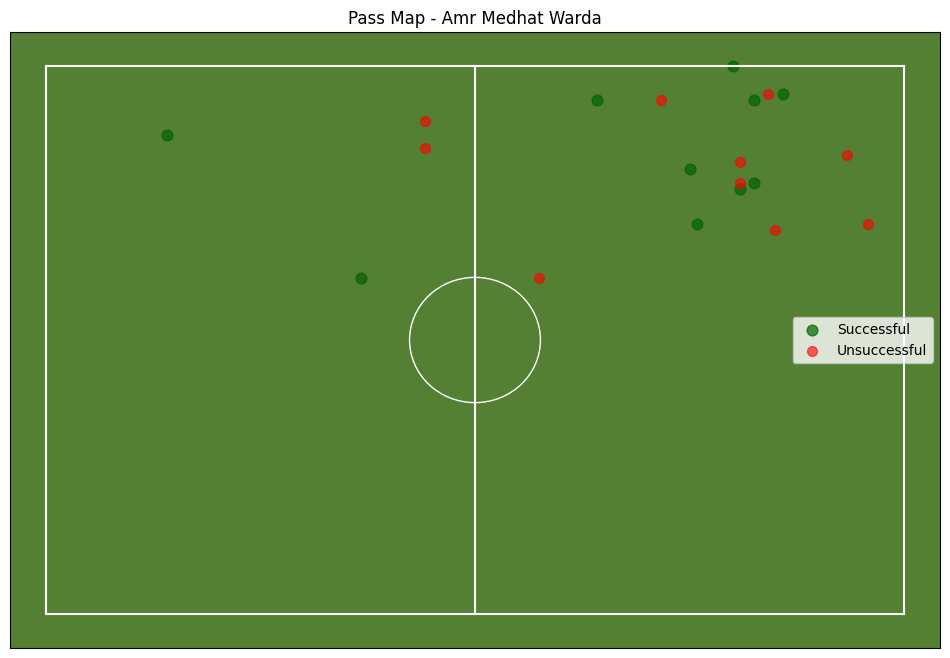


Match Summary:
Total Shots: 27
Total Passes: 951
Total Goals: 3


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
import json
import os
from pathlib import Path
import warnings
import random  # <-- Import random for selecting a random player
warnings.filterwarnings('ignore')

# Data path settings
DATA_DIR = '/kaggle/input'

def load_competitions():
    """Load tournament data"""
    with open(f'{DATA_DIR}/competitions.json') as f:
        data = json.load(f)
    return pd.json_normalize(data)

def load_match_events(match_id):
    """Load event data for a specific match"""
    with open(f'{DATA_DIR}/{match_id}.json') as f:
        data = json.load(f)
    events_df = pd.json_normalize(data, sep="_", max_level=2)
    
    # Separate location data
    events_df[['location_x', 'location_y']] = pd.DataFrame(
        [loc if isinstance(loc, list) else [None, None] 
         for loc in events_df['location']], 
        index=events_df.index
    )
    return events_df

def draw_pitch(pitch_color='#538032', line_color='white', figsize=(12, 8)):
    """Draw a football pitch"""
    fig, ax = plt.subplots(figsize=figsize)
    
    # Background
    ax.set_facecolor(pitch_color)
    
    # Pitch dimensions
    pitch_length = 120
    pitch_width = 80
    
    # Pitch boundaries
    ax.plot([0, 0], [0, pitch_width], color=line_color)
    ax.plot([pitch_length, pitch_length], [0, pitch_width], color=line_color)
    ax.plot([0, pitch_length], [0, 0], color=line_color)
    ax.plot([0, pitch_length], [pitch_width, pitch_width], color=line_color)
    
    # Center line and circle
    ax.plot([pitch_length/2, pitch_length/2], [0, pitch_width], color=line_color)
    center_circle = plt.Circle((pitch_length/2, pitch_width/2), 9.15, 
                               fill=False, color=line_color)
    ax.add_artist(center_circle)
    
    # View settings
    ax.set_xlim(-5, pitch_length + 5)
    ax.set_ylim(-5, pitch_width + 5)
    ax.set_xticks([])
    ax.set_yticks([])
    
    return fig, ax

def get_player_stats(events_df, player_name):
    """Calculate player statistics"""
    player_events = events_df[events_df['player_name'] == player_name]
    
    stats = {
        'shots': len(player_events[player_events['type_name'] == 'Shot']),
        'goals': len(player_events[
            (player_events['type_name'] == 'Shot') & 
            (player_events['shot_outcome_name'] == 'Goal')
        ]),
        'passes': len(player_events[player_events['type_name'] == 'Pass']),
        'pass_accuracy': (
            player_events[
                (player_events['type_name'] == 'Pass') & 
                (player_events['pass_outcome_name'].isna())
            ].shape[0] / 
            len(player_events[player_events['type_name'] == 'Pass']) * 100
            if len(player_events[player_events['type_name'] == 'Pass']) > 0 
            else 0
        )
    }
    return stats

def plot_shot_map(events_df, player_name=None):
    """Plot shot map with a legend explaining red/blue markers."""
    # Filter shots
    shots = events_df[events_df['type_name'] == 'Shot']
    if player_name:
        shots = shots[shots['player_name'] == player_name]
    
    # Draw the pitch
    fig, ax = draw_pitch()

    # Color: red = goal, blue = not goal
    colors = [
        'red' if outcome == 'Goal' else 'blue' 
        for outcome in shots['shot_outcome_name']
    ]
    
    # Plot shots
    ax.scatter(
        shots['location_x'],
        shots['location_y'],
        c=colors,
        alpha=0.6,
        s=100
    )

    # Add title
    plt.title(f"Shot Map - {player_name if player_name else 'All Players'}")
    
    # Create a custom legend
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', 
               label='Goal', markerfacecolor='red', markersize=10),
        Line2D([0], [0], marker='o', color='w', 
               label='Not Goal', markerfacecolor='blue', markersize=10),
    ]
    ax.legend(handles=legend_elements, loc='upper right')

    return fig

def plot_pass_map(events_df, player_name):
    """Plot pass map"""
    passes = events_df[
        (events_df['type_name'] == 'Pass') & 
        (events_df['player_name'] == player_name)
    ]
    
    fig, ax = draw_pitch()
    
    # Successful passes (darker green, slightly bigger)
    successful = passes[passes['pass_outcome_name'].isna()]
    ax.scatter(
        successful['location_x'],
        successful['location_y'],
        c='#006400',       # Dark green color
        alpha=0.7,
        label='Successful',
        s=60               # Increased size
    )
    
    # Unsuccessful passes
    unsuccessful = passes[passes['pass_outcome_name'].notna()]
    ax.scatter(
        unsuccessful['location_x'],
        unsuccessful['location_y'],
        c='red',
        alpha=0.6,
        label='Unsuccessful',
        s=50
    )
    
    plt.title(f"Pass Map - {player_name}")
    plt.legend()
    return fig

# Load data
print("Loading data...")
competitions_df = load_competitions()
print("Tournament data loaded.")

# France-Argentina match (example using 7540.json)
match_id = '7540'
events_df = load_match_events(match_id)
print("Match data loaded.")

# List players in the match
players = events_df['player_name'].unique()
valid_players = [p for p in players if isinstance(p, str)]  # Filter out None

print("\nPlayers in the match:")
for player in valid_players:
    print(f"- {player}")

# Automatically pick a random player
selected_player = random.choice(valid_players)

print(f"\nRandomly selected player: {selected_player}")

# Display selected player's statistics
player_stats = get_player_stats(events_df, selected_player)
print(f"\n{selected_player} Statistics:")
print(json.dumps(player_stats, indent=2))

# Draw shot map
shot_fig = plot_shot_map(events_df, selected_player)
plt.show()

# Draw pass map
pass_fig = plot_pass_map(events_df, selected_player)
plt.show()

# Match summary statistics
print("\nMatch Summary:")
print(f"Total Shots: {len(events_df[events_df['type_name'] == 'Shot'])}")
print(f"Total Passes: {len(events_df[events_df['type_name'] == 'Pass'])}")
print(f"Total Goals: {len(events_df[(events_df['type_name'] == 'Shot') & (events_df['shot_outcome_name'] == 'Goal')])}")


- **Pitch Visualization:**  
  The `draw_pitch` function creates a graphical representation of a football pitch with defined dimensions, boundaries, a center circle, and penalty areas. This serves as the foundational backdrop for all visualizations.

- **Shot Map Creation:**  
  The `plot_team_shot_map` function:
  - Filters the match events to isolate shots for a given team.
  - Differentiates goals (displayed as red stars) from other shots (displayed as white circles).
  - Overlays these shot markers on the drawn pitch and generates a legend annotating each shot with the player’s name.

- **Key Events Summary:**  
  After loading the match data (using a function like `load_match_events` for match ID `'7530'`), the code extracts and prints key events—such as goals, cards, and substitutions—in chronological order. This provides a succinct summary of the match's critical moments.

- **Passing Network Analysis:**  
  The `create_pass_network` function:
  - Computes the average positions of players based on their passing events.
  - Counts the number of passes exchanged between players.
  - Visualizes this data on the pitch by plotting player positions and drawing connecting lines (with line thickness proportional to the pass frequency), thus highlighting team connectivity and passing patterns.

- **Final Output:**  
  The script displays shot maps for both teams, prints a detailed timeline of key match events, and concludes with a brief summary of the match analysis.

This well-structured code not only provides rich visual insights into the match but also enables a deeper understanding of team and player performance during the game.


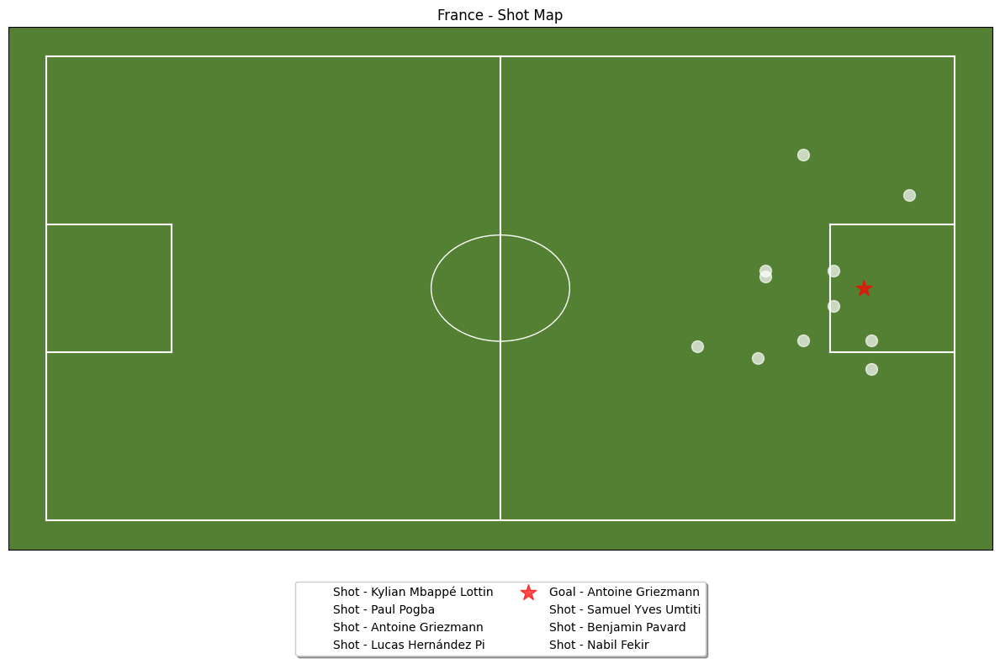

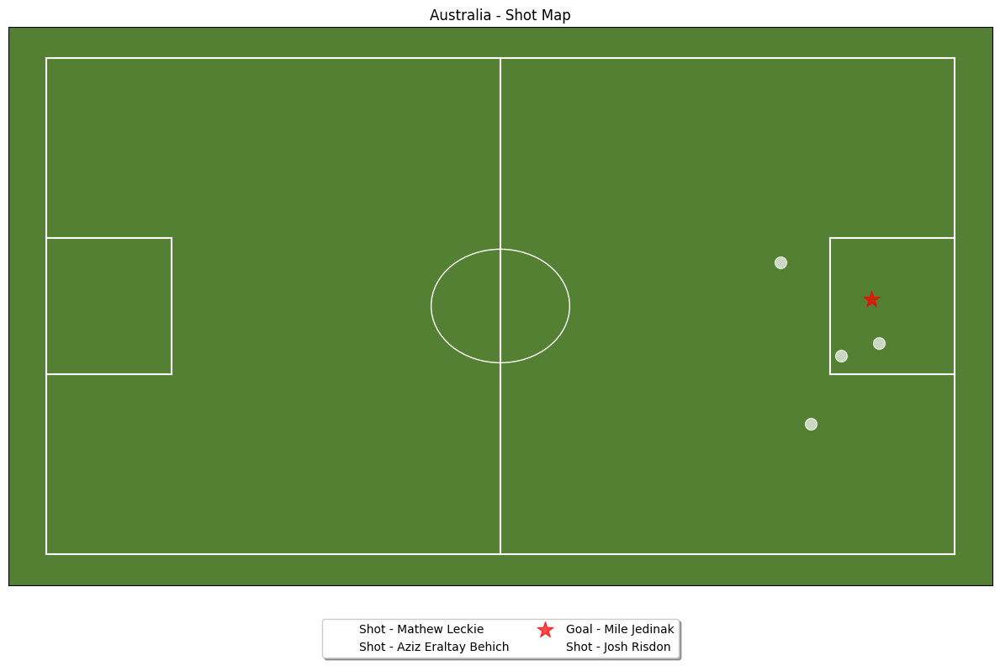


Key Events:
57' GOAL! - Antoine Griezmann (France)
61' GOAL! - Mile Jedinak (Australia)
63' SUBSTITUTION - Andrew Nabbout (Australia)
69' SUBSTITUTION - Antoine Griezmann (France)
69' SUBSTITUTION - Ousmane Dembélé (France)
70' SUBSTITUTION - Tom Rogić (Australia)
77' SUBSTITUTION - Corentin Tolisso (France)
83' SUBSTITUTION - Robbie Kruse (Australia)


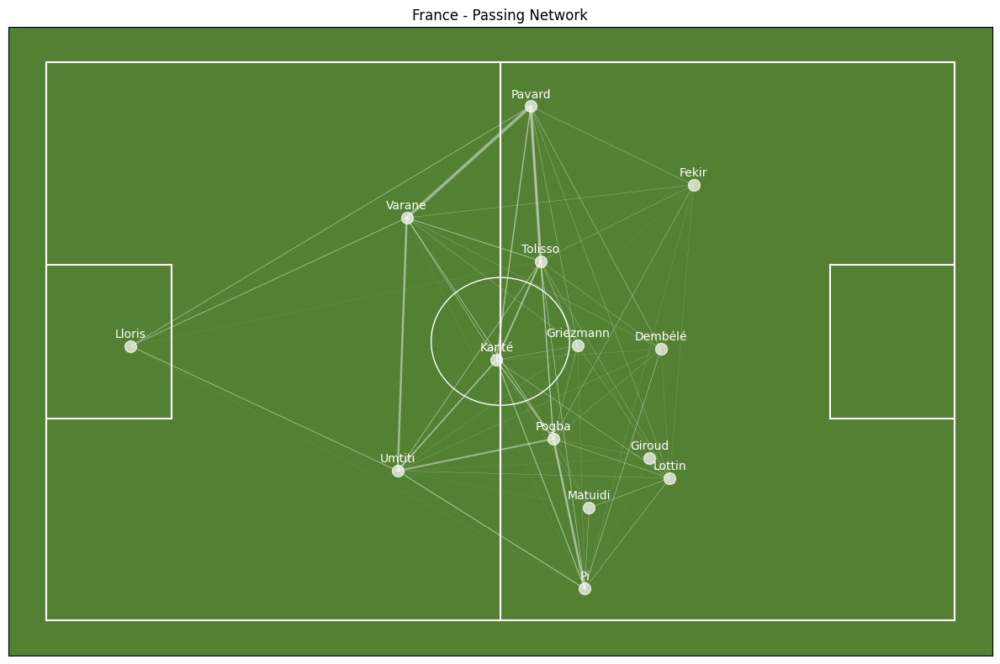

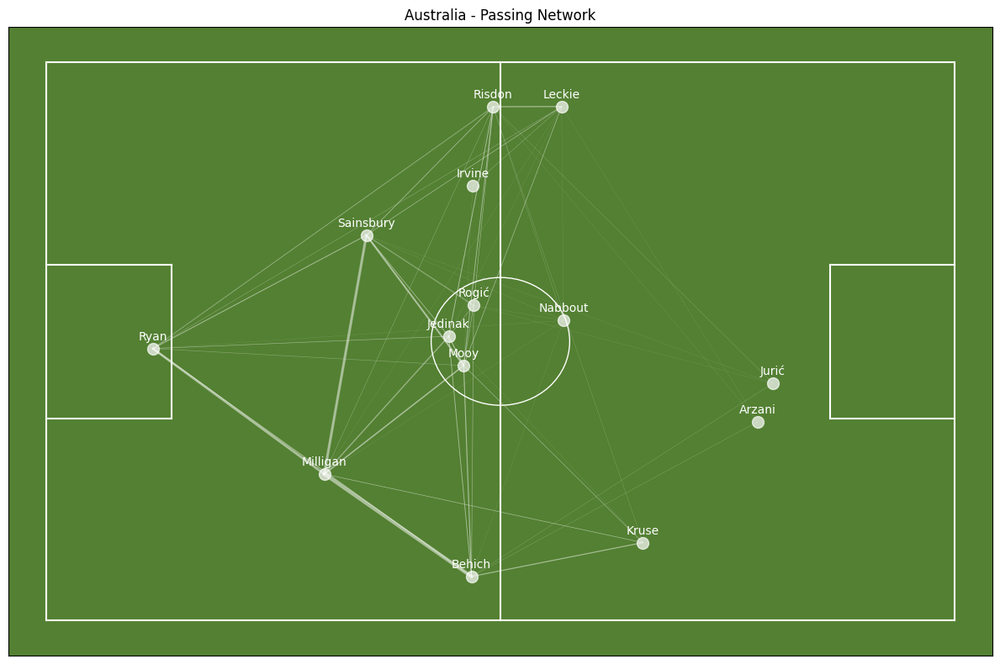


MATCH ANALYSIS SUMMARY:
1. France vs Australia match had 23 key events.


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import os
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

def draw_pitch(ax, pitch_color='#538032', line_color='white'):
    """Draw a football pitch"""
    ax.set_facecolor(pitch_color)
    
    pitch_length = 120
    pitch_width = 80
    
    ax.plot([0, 0], [0, pitch_width], color=line_color)
    ax.plot([pitch_length, pitch_length], [0, pitch_width], color=line_color)
    ax.plot([0, pitch_length], [0, 0], color=line_color)
    ax.plot([0, pitch_length], [pitch_width, pitch_width], color=line_color)
    
    ax.plot([pitch_length/2, pitch_length/2], [0, pitch_width], color=line_color)
    center_circle = plt.Circle((pitch_length/2, pitch_width/2), 9.15, 
                             fill=False, color=line_color)
    ax.add_artist(center_circle)
    
    ax.plot([0, 16.5], [pitch_width/2 - 11, pitch_width/2 - 11], color=line_color)
    ax.plot([16.5, 16.5], [pitch_width/2 - 11, pitch_width/2 + 11], color=line_color)
    ax.plot([0, 16.5], [pitch_width/2 + 11, pitch_width/2 + 11], color=line_color)
    
    ax.plot([pitch_length, pitch_length-16.5], [pitch_width/2 - 11, pitch_width/2 - 11], color=line_color)
    ax.plot([pitch_length-16.5, pitch_length-16.5], [pitch_width/2 - 11, pitch_width/2 + 11], color=line_color)
    ax.plot([pitch_length, pitch_length-16.5], [pitch_width/2 + 11, pitch_width/2 + 11], color=line_color)
    
    ax.set_xlim(-5, pitch_length + 5)
    ax.set_ylim(-5, pitch_width + 5)
    ax.set_xticks([])
    ax.set_yticks([])

def plot_team_shot_map(events_df, team_name):
    """Draw a team's shot map"""
    shots = events_df[
        (events_df['type_name'] == 'Shot') & 
        (events_df['team_name'] == team_name)
    ]
    
    fig, ax = plt.subplots(figsize=(12, 8))
    plt.title(f"{team_name} - Shot Map")
    
    draw_pitch(ax)
    
    for _, shot in shots.iterrows():
        x = shot['location_x']
        y = shot['location_y']
        
        if shot['shot_outcome_name'] == 'Goal':
            color = 'red'
            size = 200
            marker = '*'
            label = f"Goal - {shot['player_name']}"
        else:
            color = 'white'
            size = 100
            marker = 'o'
            label = f"Shot - {shot['player_name']}"
            
        ax.scatter(x, y, c=color, s=size, alpha=0.7, marker=marker, label=label)
    
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), 
             loc='upper center', bbox_to_anchor=(0.5, -0.05),
             ncol=2, fancybox=True, shadow=True)
    
    plt.tight_layout()
    return fig

match_id = '7530'
events_df = load_match_events(match_id)

teams = events_df['team_name'].unique()
team1, team2 = teams[0], teams[1]

for team in [team1, team2]:
    fig = plot_team_shot_map(events_df, team)
    plt.show()

print("\nKey Events:")
important_events = events_df[
    (events_df['type_name'].isin(['Shot', 'Substitution', 'Card'])) & 
    (events_df['minute'].notna())
].sort_values('minute')

for _, event in important_events.iterrows():
    minute = int(event['minute'])
    if event['type_name'] == 'Shot' and event['shot_outcome_name'] == 'Goal':
        print(f"{minute}' GOAL! - {event['player_name']} ({event['team_name']})")
    elif event['type_name'] == 'Card':
        print(f"{minute}' CARD - {event['player_name']} ({event['team_name']})")
    elif event['type_name'] == 'Substitution':
        print(f"{minute}' SUBSTITUTION - {event['player_name']} ({event['team_name']})")

def create_pass_network(events_df, team_name):
    """Create a team's passing network"""
    passes = events_df[
        (events_df['type_name'] == 'Pass') & 
        (events_df['team_name'] == team_name) &
        (events_df['pass_outcome_name'].isna())
    ]
    
    player_positions = passes.groupby('player_name')[['location_x', 'location_y']].mean()
    pass_combinations = passes.groupby(['player_name', 'pass_recipient_name']).size()
    
    return player_positions, pass_combinations

for team in [team1, team2]:
    player_positions, pass_combinations = create_pass_network(events_df, team)
    
    fig, ax = plt.subplots(figsize=(12, 8))
    plt.title(f"{team} - Passing Network")
    
    draw_pitch(ax)
    
    for player in player_positions.index:
        x = player_positions.loc[player, 'location_x']
        y = player_positions.loc[player, 'location_y']
        ax.scatter(x, y, c='white', s=100, alpha=0.7)
        ax.annotate(player.split()[-1], (x, y), 
                   xytext=(0, 5), textcoords='offset points',
                   ha='center', va='bottom', color='white')
    
    for (player1, player2), count in pass_combinations.items():
        if player1 in player_positions.index and player2 in player_positions.index:
            x1, y1 = player_positions.loc[player1]
            x2, y2 = player_positions.loc[player2]
            width = count / pass_combinations.max() * 3
            ax.plot([x1, x2], [y1, y2], 'w-', alpha=0.3, linewidth=width)
    
    plt.tight_layout()
    plt.show()

print("\nMATCH ANALYSIS SUMMARY:")
print(f"1. {team1} vs {team2} match had {len(important_events)} key events.")


# **Player Performance Charts**

## **Performance Analysis Charts**
- **Radar Chart:** Displays the player's actions across different categories.
- **Pass Success Rate:** Shows the pass success percentage using a pie chart.
- **Activity Over Time:** Displays the distribution of the player's activity throughout the match.
- **Statistics Summary:** Lists all numerical data in a structured format.

## **Heatmap**
- Visualizes the player's movement and activity intensity on the pitch.
- Uses different colors to indicate activity density.
- Provides a complete visualization with pitch lines included.

## **Detailed Statistics**
- **Total Passes**
- **Successful Passes**
- **Pass Success Rate**
- **Shots and Goals**
- **Ball Recoveries**
- **Duels**
- **Dribbling**
- **Tackles**


Players in the match:
1. Andrew Nabbout
2. Trent Sainsbury
3. Benjamin Pavard
4. Aaron Mooy
5. Corentin Tolisso
6. Kylian Mbappé Lottin
7. Aziz Eraltay Behich
8. Tom Rogić
9. Raphaël Varane
10. Antoine Griezmann
11. Robbie Kruse
12. Hugo Lloris
13. Paul Pogba
14. Mile Jedinak
15. Samuel Yves Umtiti
16. N"Golo Kanté
17. Mathew Ryan
18. Mathew Leckie
19. Lucas Hernández Pi
20. Josh Risdon
21. Ousmane Dembélé
22. Mark Milligan
23. Tomi Jurić
24. Nabil Fekir
25. Olivier Giroud
26. Jackson Irvine
27. Blaise Matuidi
28. Daniel Arzani

Analyzing Andrew Nabbout...


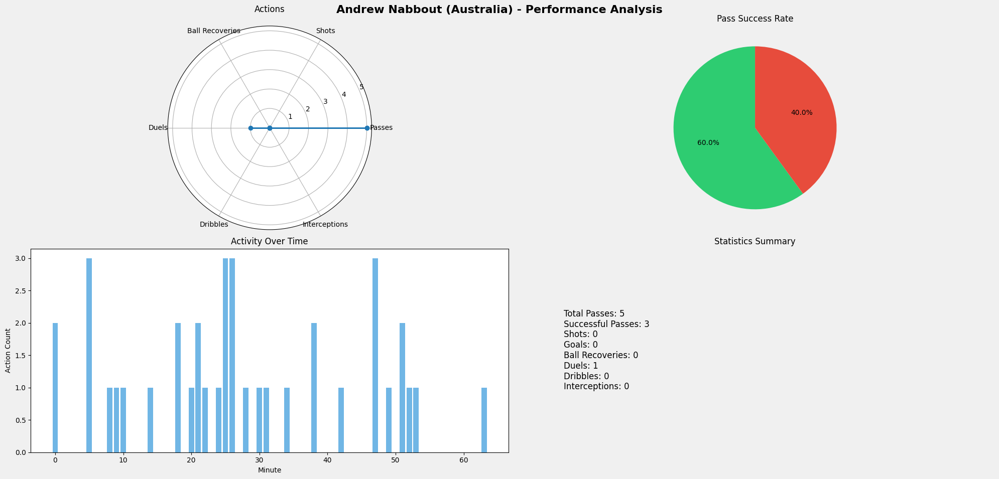


Andrew Nabbout Detailed Statistics:
Total Passes: 5
Successful Passes: 3
Shots: 0
Goals: 0
Ball Recoveries: 0
Duels: 1
Dribbles: 0
Interceptions: 0
Pass Success Rate: %60.0

Analyzing Trent Sainsbury...


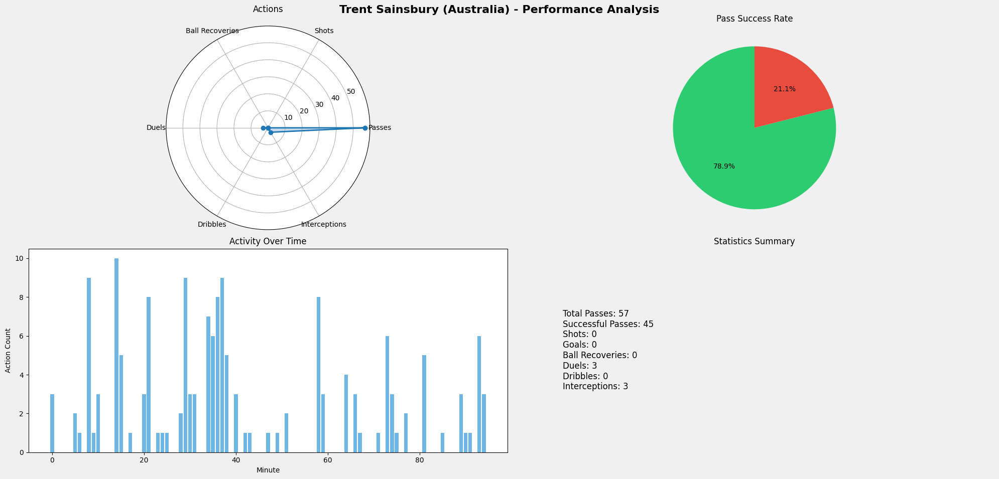


Trent Sainsbury Detailed Statistics:
Total Passes: 57
Successful Passes: 45
Shots: 0
Goals: 0
Ball Recoveries: 0
Duels: 3
Dribbles: 0
Interceptions: 3
Pass Success Rate: %78.9

Analyzing Benjamin Pavard...


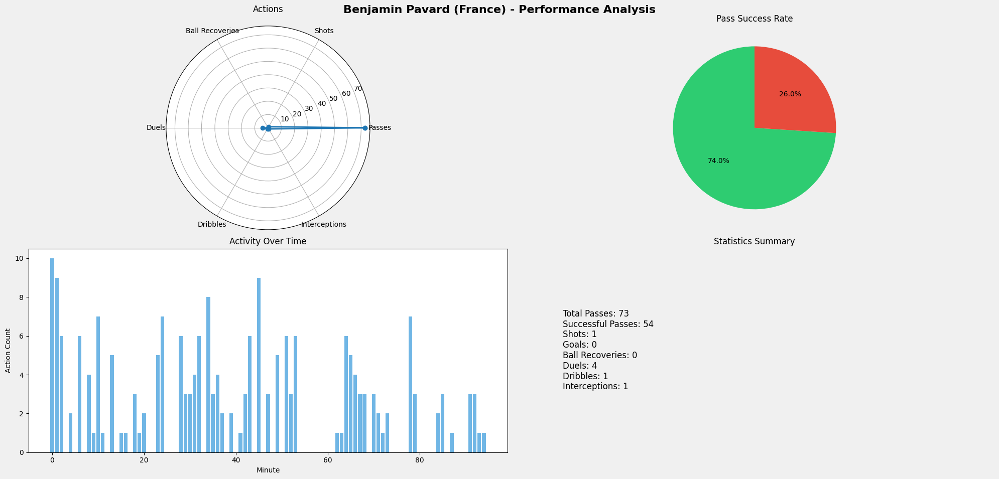


Benjamin Pavard Detailed Statistics:
Total Passes: 73
Successful Passes: 54
Shots: 1
Goals: 0
Ball Recoveries: 0
Duels: 4
Dribbles: 1
Interceptions: 1
Pass Success Rate: %74.0

Analyzing Aaron Mooy...


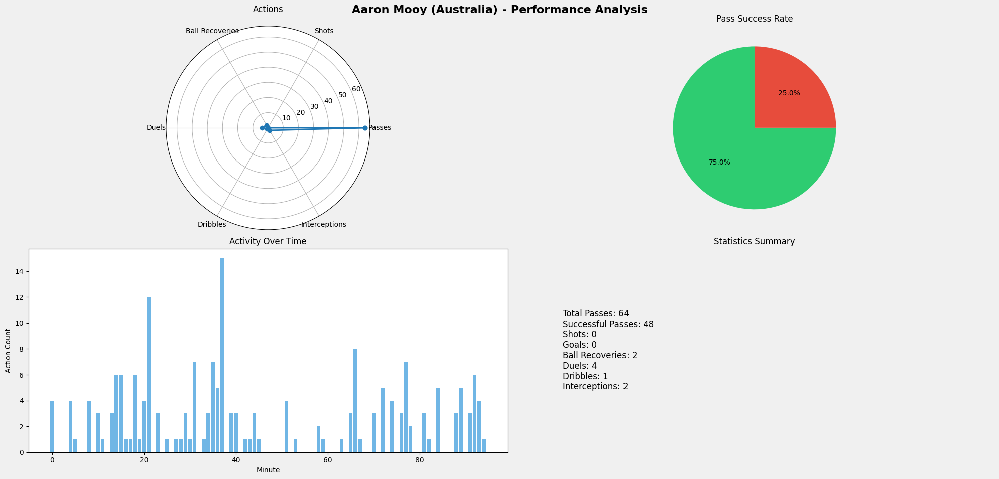


Aaron Mooy Detailed Statistics:
Total Passes: 64
Successful Passes: 48
Shots: 0
Goals: 0
Ball Recoveries: 2
Duels: 4
Dribbles: 1
Interceptions: 2
Pass Success Rate: %75.0

Analyzing Corentin Tolisso...


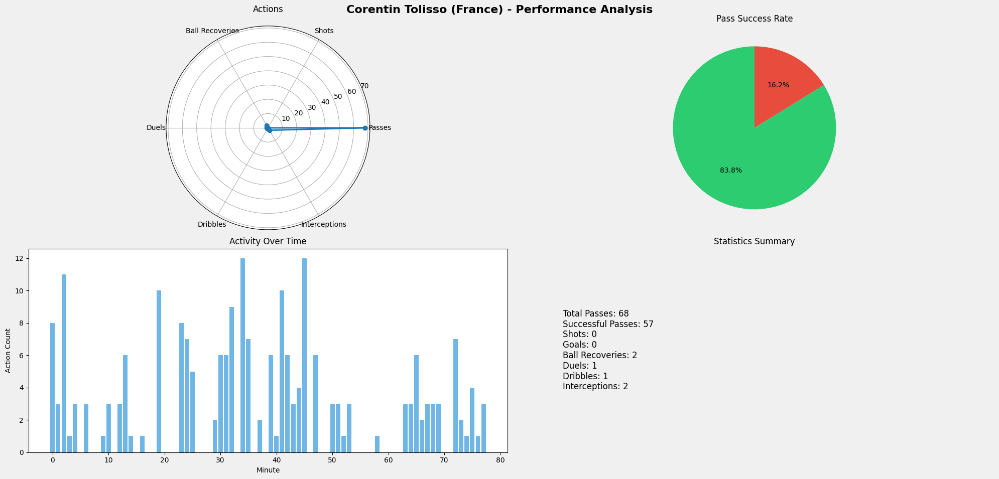


Corentin Tolisso Detailed Statistics:
Total Passes: 68
Successful Passes: 57
Shots: 0
Goals: 0
Ball Recoveries: 2
Duels: 1
Dribbles: 1
Interceptions: 2
Pass Success Rate: %83.8


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle, Circle
import warnings
warnings.filterwarnings('ignore')

def extract_name(x):
    """Extract name from JSON format"""
    if isinstance(x, dict) and 'name' in x:
        return x['name']
    return None

def analyze_player_performance(events_df, player_name):
    """Generate player performance analysis"""
    player_events = events_df[events_df['player'].apply(lambda x: isinstance(x, dict) and x.get('name') == player_name)]
    
    stats = {
        'Total Passes': len(player_events[player_events['type'].apply(extract_name) == 'Pass']),
        'Successful Passes': len(player_events[
            (player_events['type'].apply(extract_name) == 'Pass') & 
            (player_events['pass'].apply(lambda x: not isinstance(x, dict) or 'outcome' not in x))
        ]),
        'Shots': len(player_events[player_events['type'].apply(extract_name) == 'Shot']),
        'Goals': len(player_events[
            (player_events['type'].apply(extract_name) == 'Shot') & 
            (player_events['shot'].apply(lambda x: isinstance(x, dict) and x.get('outcome', {}).get('name') == 'Goal'))
        ]),
        'Ball Recoveries': len(player_events[player_events['ball_recovery'].notna()]),
        'Duels': len(player_events[player_events['duel'].notna()]),
        'Dribbles': len(player_events[player_events['dribble'].notna()]),
        'Interceptions': len(player_events[player_events['interception'].notna()])
    }
    
    if stats['Total Passes'] > 0:
        stats['Pass Success Rate'] = stats['Successful Passes'] / stats['Total Passes'] * 100
    else:
        stats['Pass Success Rate'] = 0
        
    return stats

def plot_player_performance(events_df, player_name):
    """Generate player performance charts"""
    stats = analyze_player_performance(events_df, player_name)
    team_name = events_df[events_df['player'].apply(lambda x: isinstance(x, dict) and x.get('name') == player_name)]['team'].iloc[0]['name']
    
    fig = plt.figure(figsize=(20, 10))
    fig.patch.set_facecolor('#f0f0f0')
    
    plt.suptitle(f'{player_name} ({team_name}) - Performance Analysis', 
                size=16, weight='bold', y=0.95)
    
    ax1 = plt.subplot(221, projection='polar')
    radar_stats = {
        'Passes': stats['Total Passes'],
        'Shots': stats['Shots'],
        'Ball Recoveries': stats['Ball Recoveries'],
        'Duels': stats['Duels'],
        'Dribbles': stats['Dribbles'],
        'Interceptions': stats['Interceptions']
    }
    
    categories = list(radar_stats.keys())
    values = list(radar_stats.values())
    
    angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False)
    values = np.concatenate((values, [values[0]]))
    angles = np.concatenate((angles, [angles[0]]))
    
    ax1.plot(angles, values, 'o-', linewidth=2)
    ax1.fill(angles, values, alpha=0.25)
    ax1.set_xticks(angles[:-1])
    ax1.set_xticklabels(categories)
    ax1.set_title('Actions', pad=20)
    
    ax2 = plt.subplot(222)
    pass_success = stats['Pass Success Rate']
    sizes = [pass_success, 100-pass_success]
    colors = ['#2ecc71', '#e74c3c']
    ax2.pie(sizes, colors=colors, autopct='%1.1f%%', startangle=90)
    ax2.set_title('Pass Success Rate')
    
    ax3 = plt.subplot(223)
    player_events = events_df[events_df['player'].apply(lambda x: isinstance(x, dict) and x.get('name') == player_name)]
    event_times = player_events['minute'].value_counts().sort_index()
    ax3.bar(event_times.index, event_times.values, color='#3498db', alpha=0.7)
    ax3.set_xlabel('Minute')
    ax3.set_ylabel('Action Count')
    ax3.set_title('Activity Over Time')
    
    ax4 = plt.subplot(224)
    ax4.axis('off')
    stats_text = '\n'.join([
        f'Total Passes: {stats["Total Passes"]}',
        f'Successful Passes: {stats["Successful Passes"]}',
        f'Shots: {stats["Shots"]}',
        f'Goals: {stats["Goals"]}',
        f'Ball Recoveries: {stats["Ball Recoveries"]}',
        f'Duels: {stats["Duels"]}',
        f'Dribbles: {stats["Dribbles"]}',
        f'Interceptions: {stats["Interceptions"]}'
    ])
    ax4.text(0.1, 0.5, stats_text, fontsize=12, verticalalignment='center')
    ax4.set_title('Statistics Summary')
    
    plt.tight_layout()
    return fig

match_id = '7530'
events_df = pd.read_json(f'/kaggle/input/{match_id}.json')

players = events_df['player'].dropna().apply(extract_name).unique()
players = [p for p in players if p is not None]

print("Players in the match:")
for i, player in enumerate(players, 1):
    print(f"{i}. {player}")

for player in players[:5]:
    print(f"\nAnalyzing {player}...")
    fig = plot_player_performance(events_df, player)
    plt.show()
    
    stats = analyze_player_performance(events_df, player)
    print(f"\n{player} Detailed Statistics:")
    for stat, value in stats.items():
        if stat == 'Pass Success Rate':
            print(f"{stat}: %{value:.1f}")
        else:
            print(f"{stat}: {value}")


1. **Data Loading & Processing**  
   - **`load_and_process_data()`**  
     - Iterates through all `.json` files in the specified `DATA_DIR` (excluding `competitions.json`).  
     - For each event, the function extracts the team name and event type (e.g., `Shot`, `Pass`) to update the team’s cumulative stats (shots, passes, and possessions).  
     - Keeps track of the unique match IDs per team to determine the number of matches played.  
     - Calculates average per-match statistics (`shots_per_match`, `passes_per_match`, and `possessions_per_match`) for each team.  
     - Stores the final results in a Pandas DataFrame for further analysis.

2. **Team Statistics Printing**  
   - **`print_team_stats(team_stats)`**  
     - Prints out the top-performing teams in terms of **shots**, **passes**, and **possession** by sorting the DataFrame on the respective per-match metrics.  
     - Provides a quick textual summary of which teams excelled in each category.

3. **Visualization**  
   - **`plot_team_analysis(team_stats)`**  
     - Creates a figure with two subplots to showcase the **top 10 teams** in:
       1. **Shots per Match**  
       2. **Passes per Match**  
     - Uses Seaborn bar plots with the **Viridis** color palette.  
     - The chart titles and rotated x-axis labels enhance readability and highlight key insights at a glance.

4. **Main Workflow**  
   - **`main()`**  
     - Calls `load_and_process_data()` to retrieve and process the event data.  
     - Prints team statistics (top teams in shots, passes, and possession).  
     - Invokes `plot_team_analysis()` to generate visual comparisons.  
     - Returns the final `team_stats` DataFrame for potential further analysis or reporting.

Overall, this script automates the process of aggregating raw event data, computing meaningful metrics per team, and generating both textual and graphical summaries—providing a clear overview of team performance in the 2018 FIFA World Cup event dataset.



Top Shooting Teams:
         total_shots  total_passes  total_possessions  matches_played  \
Germany           73          2070               6357               3   
Brazil           103          2900               9062               5   
Spain             77          3506              10272               4   
Croatia          124          4066              11552               7   
Mexico            62          1756               5457               4   

         shots_per_match  passes_per_match  possessions_per_match  
Germany        24.333333        690.000000            2119.000000  
Brazil         20.600000        580.000000            1812.400000  
Spain          19.250000        876.500000            2568.000000  
Croatia        17.714286        580.857143            1650.285714  
Mexico         15.500000        439.000000            1364.250000  

Top Passing Teams:
              total_shots  total_passes  total_possessions  matches_played  \
Spain                  77         

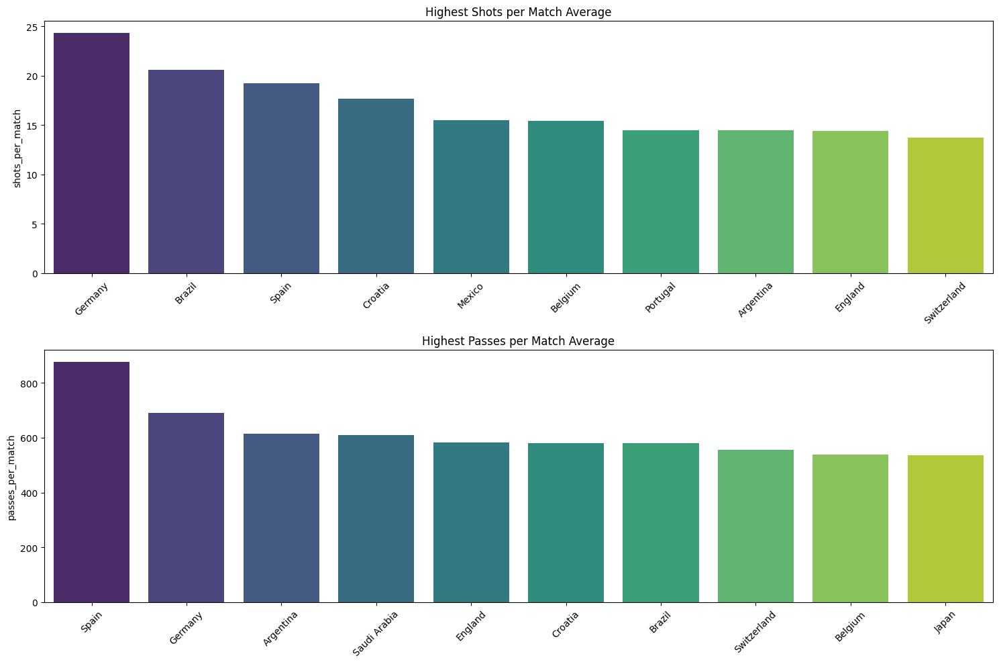

In [7]:
import pandas as pd
import json
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from collections import defaultdict

# Data path settings
DATA_DIR = '/kaggle/input'

def load_and_process_data():
    """Load and process all event data"""
    team_stats = defaultdict(lambda: {
        'total_shots': 0,
        'total_passes': 0,
        'total_possessions': 0,
        'matches': set()  # Store unique match IDs
    })
    
    # Load JSON files (excluding competitions.json)
    for file_path in Path(DATA_DIR).glob('*.json'):
        if file_path.name == 'competitions.json':
            continue
            
        with open(file_path, 'r', encoding='utf-8') as f:
            events = json.load(f)
            match_id = file_path.stem
            
            for event in events:
                # Get team name
                if 'team' in event and isinstance(event['team'], dict):
                    team_name = event['team'].get('name')
                    event_type = event['type'].get('name') if 'type' in event else None
                    
                    if team_name:
                        team_stats[team_name]['matches'].add(match_id)
                        
                        # Update statistics based on event type
                        if event_type == 'Shot':
                            team_stats[team_name]['total_shots'] += 1
                        elif event_type == 'Pass':
                            team_stats[team_name]['total_passes'] += 1
                        
                        # Update possession statistics
                        if event.get('possession_team', {}).get('name') == team_name:
                            team_stats[team_name]['total_possessions'] += 1
    
    # Convert to DataFrame
    team_df = pd.DataFrame.from_dict(team_stats, orient='index')
    team_df['matches_played'] = team_df['matches'].apply(len)
    
    # Calculate average statistics
    team_df['shots_per_match'] = team_df['total_shots'] / team_df['matches_played']
    team_df['passes_per_match'] = team_df['total_passes'] / team_df['matches_played']
    team_df['possessions_per_match'] = team_df['total_possessions'] / team_df['matches_played']
    
    # Remove the matches column (no longer needed)
    team_df = team_df.drop('matches', axis=1)
    
    return team_df

def plot_team_analysis(team_stats):
    """Visualize team analysis"""
    plt.figure(figsize=(15, 10))
    
    # Shot analysis
    plt.subplot(2, 1, 1)
    top_shooting = team_stats.sort_values('shots_per_match', ascending=False).head(10)
    sns.barplot(data=top_shooting, 
                x=top_shooting.index, 
                y='shots_per_match',
                palette='viridis')
    plt.title('Highest Shots per Match Average')
    plt.xticks(rotation=45)
    
    # Pass analysis
    plt.subplot(2, 1, 2)
    top_passing = team_stats.sort_values('passes_per_match', ascending=False).head(10)
    sns.barplot(data=top_passing,
                x=top_passing.index,
                y='passes_per_match',
                palette='viridis')
    plt.title('Highest Passes per Match Average')
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()

def print_team_stats(team_stats):
    """Print team statistics"""
    print("\nTop Shooting Teams:")
    print(team_stats.sort_values('shots_per_match', ascending=False).head())
    
    print("\nTop Passing Teams:")
    print(team_stats.sort_values('passes_per_match', ascending=False).head())
    
    print("\nTop Possession Teams:")
    print(team_stats.sort_values('possessions_per_match', ascending=False).head())

def main():
    # Load and process data
    team_stats = load_and_process_data()
    
    # Display statistics
    print_team_stats(team_stats)
    
    # Show visualizations
    plot_team_analysis(team_stats)
    
    return team_stats

if __name__ == "__main__":
    team_stats = main()


## Code Explanation

This script focuses on **tactical analysis** of football event data, specifically examining team formations, their usage frequency, and the duration of each formation throughout matches. Below is a breakdown of each main component:

1. **Data Loading & Initial Analysis**  
   - **`load_and_analyze_tactics()`**  
     - Iterates over all `.json` files in the specified directory (`DATA_DIR`), excluding `competitions.json`.  
     - For each event in a match file, it checks if there is a `tactics` key containing a `formation`.  
     - Stores formation-related information in a `formation_stats` dictionary:
       - **`total_matches`**: A set of unique match IDs for the team.  
       - **`formations`**: A count of how many times each formation was used.  
       - **`avg_duration`**: A list of durations for each formation, used later to compute average durations.

2. **Data Processing**  
   - **`process_formation_stats(formation_stats)`**  
     - Transforms the raw `formation_stats` dictionary into a more structured Pandas DataFrame.  
     - For each team:
       - Determines the **most frequently used formation** (primary formation).  
       - Calculates the **average duration** for each formation and specifically extracts the duration for the primary formation.  
       - Creates a consolidated record containing:
         - **Team name**  
         - **Total matches played**  
         - **Primary formation** and how often it was used  
         - **Formation variety** (the total number of different formations used)  
         - **Average duration** of the primary formation

3. **Visualization**  
   - **`plot_tactical_analysis(stats_df)`**  
     - Generates two bar plots using Seaborn:
       1. **Top 10 Teams by Primary Formation Usage**  
       2. **Top 10 Teams by Formation Variety**  
     - Employs the **Viridis** color palette for a clean and modern look.  
     - Rotates x-axis labels for better readability, and arranges the subplots vertically.

4. **Insights Printing**  
   - **`print_tactical_insights(stats_df)`**  
     - Prints out:
       - **Teams with the Most Consistent Formation**: Those that heavily rely on a single primary formation.  
       - **Teams with the Most Formation Variety**: Those that experimented with multiple different formations.

5. **Main Workflow**  
   - **`main()`**  
     - Calls `load_and_analyze_tactics()` to build the tactical statistics.  
     - Prints key tactical insights via `print_tactical_insights()`.  
     - Visualizes the data using `plot_tactical_analysis()`.  
     - Returns the final `tactical_stats` DataFrame for any further usage or analysis.

By aggregating formation usage and duration information, this script provides a clear view of each team's tactical preferences, including how frequently they stick to a primary formation versus how often they switch tacti



Teams with Most Consistent Formation:
          team  primary_formation  primary_formation_usage
11     England                352                       12
17     Uruguay                442                        7
7       Brazil                433                        6
13  Costa Rica                343                        6
18    Portugal                442                        6

Teams with Most Formation Variety:
           team  formation_variety  primary_formation
2       Germany                  7               4231
26    Argentina                  7                442
5       Croatia                  6               4231
6       Belgium                  6                343
21  South Korea                  6                442


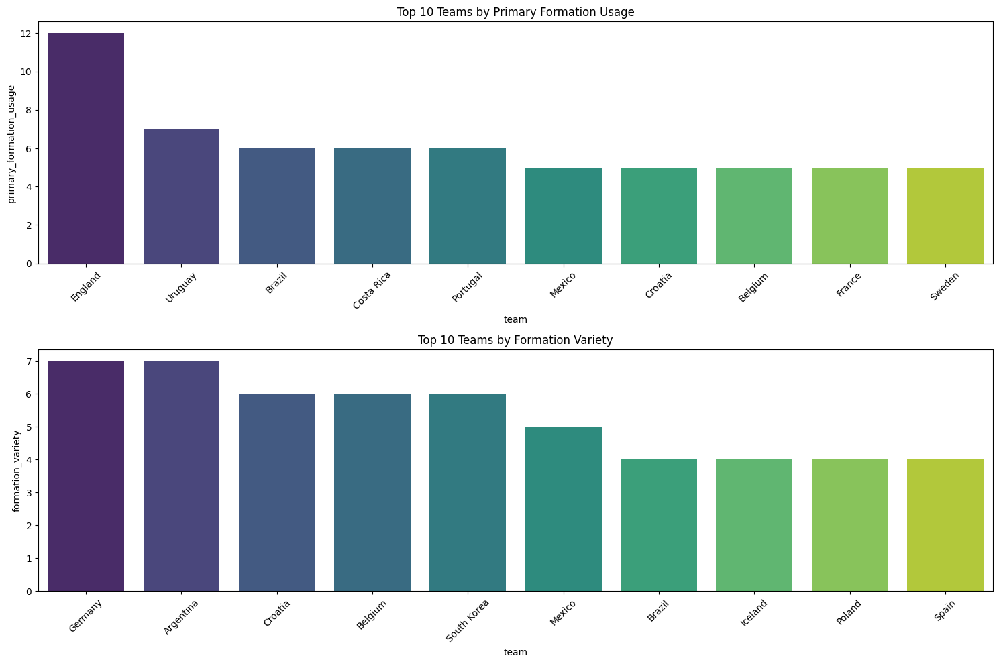

In [8]:
import pandas as pd
import json
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from collections import defaultdict

# Data path settings
DATA_DIR = '/kaggle/input'

def load_and_analyze_tactics():
    """Load and analyze tactical data from events"""
    # Store formation statistics
    formation_stats = defaultdict(lambda: {
        'total_matches': set(),  # Using set for unique matches
        'formations': defaultdict(int),  # Count of each formation used
        'avg_duration': defaultdict(list)  # Duration of each formation
    })
    
    # Load and process each match file
    for file_path in Path(DATA_DIR).glob('*.json'):
        if file_path.name == 'competitions.json':
            continue
            
        with open(file_path, 'r', encoding='utf-8') as f:
            events = json.load(f)
            match_id = file_path.stem
            
            # Process each event
            for event in events:
                if 'tactics' in event and 'formation' in event['tactics']:
                    team_name = event['team'].get('name')
                    formation = event['tactics']['formation']
                    duration = event.get('duration', 0)
                    
                    if team_name:
                        formation_stats[team_name]['total_matches'].add(match_id)
                        formation_stats[team_name]['formations'][formation] += 1
                        formation_stats[team_name]['avg_duration'][formation].append(duration)
    
    return process_formation_stats(formation_stats)

def process_formation_stats(formation_stats):
    """Process raw formation statistics into a DataFrame"""
    processed_stats = []
    
    for team, stats in formation_stats.items():
        # Calculate most used formation
        formations = stats['formations']
        most_used = max(formations.items(), key=lambda x: x[1])
        
        # Calculate average duration for each formation
        avg_durations = {
            form: sum(durations)/len(durations) 
            for form, durations in stats['avg_duration'].items()
        }
        
        # Create record for team
        record = {
            'team': team,
            'total_matches': len(stats['total_matches']),
            'primary_formation': most_used[0],
            'primary_formation_usage': most_used[1],
            'formation_variety': len(formations),
            'avg_duration_primary': avg_durations.get(most_used[0], 0)
        }
        processed_stats.append(record)
    
    return pd.DataFrame(processed_stats)

def plot_tactical_analysis(stats_df):
    """Visualize tactical analysis"""
    plt.figure(figsize=(15, 10))
    
    # Formation usage plot
    plt.subplot(2, 1, 1)
    top_formations = stats_df.nlargest(10, 'primary_formation_usage')
    sns.barplot(data=top_formations,
                x='team',
                y='primary_formation_usage',
                palette='viridis')
    plt.title('Top 10 Teams by Primary Formation Usage')
    plt.xticks(rotation=45)
    
    # Formation variety plot
    plt.subplot(2, 1, 2)
    top_variety = stats_df.nlargest(10, 'formation_variety')
    sns.barplot(data=top_variety,
                x='team',
                y='formation_variety',
                palette='viridis')
    plt.title('Top 10 Teams by Formation Variety')
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()

def print_tactical_insights(stats_df):
    """Print key tactical insights"""
    print("\nTeams with Most Consistent Formation:")
    print(stats_df.nlargest(5, 'primary_formation_usage')[
        ['team', 'primary_formation', 'primary_formation_usage']])
    
    print("\nTeams with Most Formation Variety:")
    print(stats_df.nlargest(5, 'formation_variety')[
        ['team', 'formation_variety', 'primary_formation']])

def main():
    # Load and analyze tactical data
    tactical_stats = load_and_analyze_tactics()
    
    # Print insights
    print_tactical_insights(tactical_stats)
    
    # Show visualizations
    plot_tactical_analysis(tactical_stats)
    
    return tactical_stats

if __name__ == "__main__":
    tactical_stats = main()

## Code Explanation

This script loads **StatsBomb** event data from JSON files, merges all records into a single DataFrame, and then visualizes both **shot** and **pass** information on a custom-drawn soccer pitch. The `draw_soccer_pitch` function uses Matplotlib shapes (rectangles, arcs, circles) to create a more detailed and aesthetically pleasing pitch layout. The `plot_team_positions` function generates two side-by-side plots:

1. **Shot Map:** Each shot is placed according to its (x, y) coordinates, with marker size scaled by the shot’s expected goals (xG).  
2. **Pass Heatmap:** Uses a hexbin plot to show where passes originate most frequently, highlighting high-activity zones on the pitch.

In the `main` function, these visualizations are produced for all matches combined, as well as for each team individually—offering a comprehensive look at both shot-taking tendencies and pass distribution patterns across the dataset.


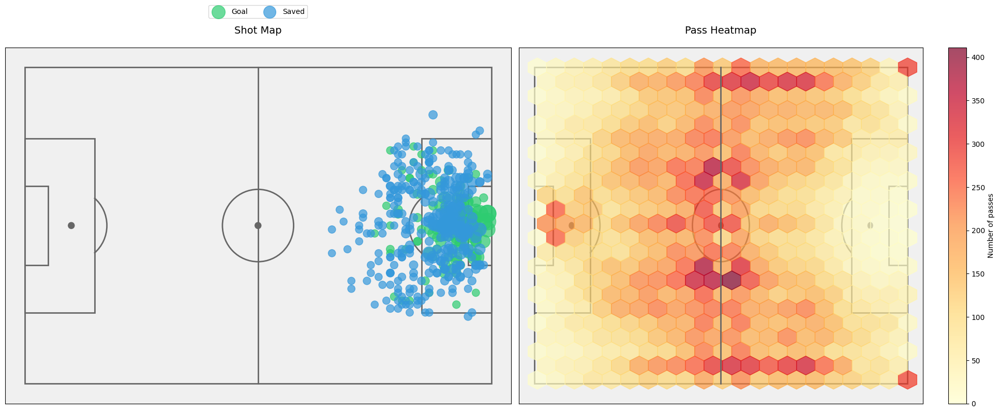

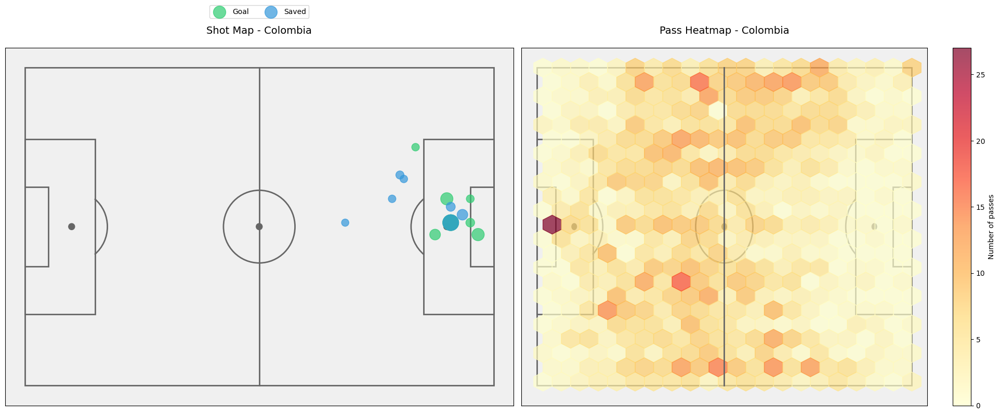

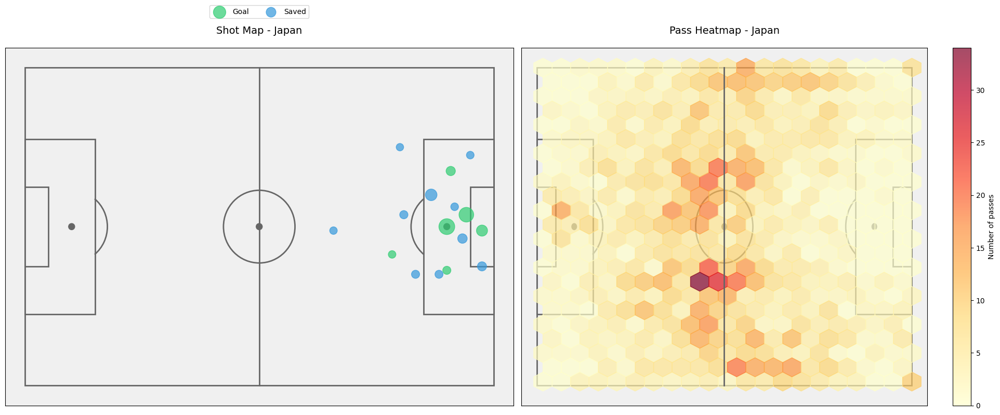

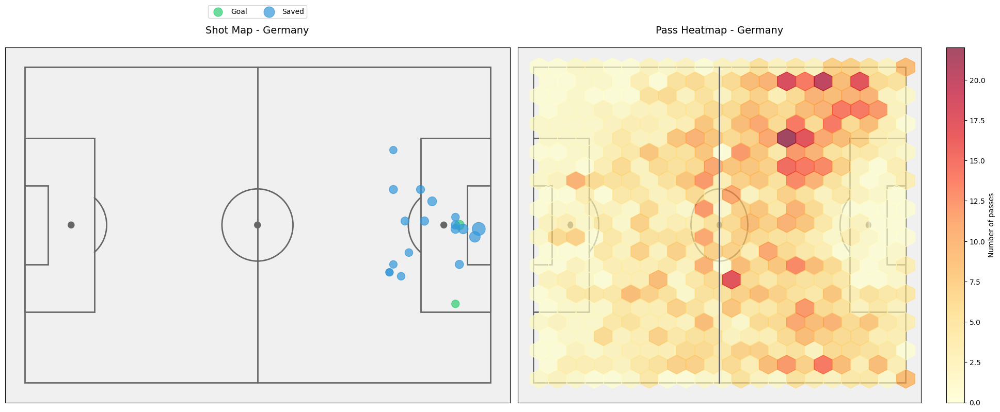

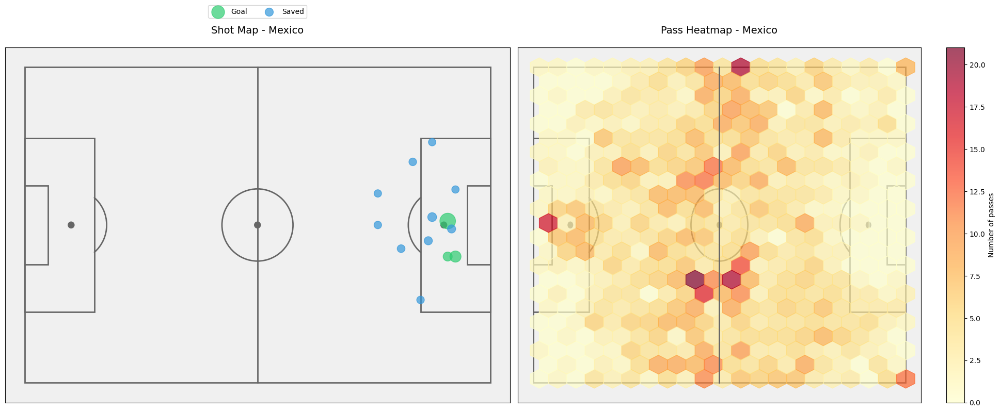

...

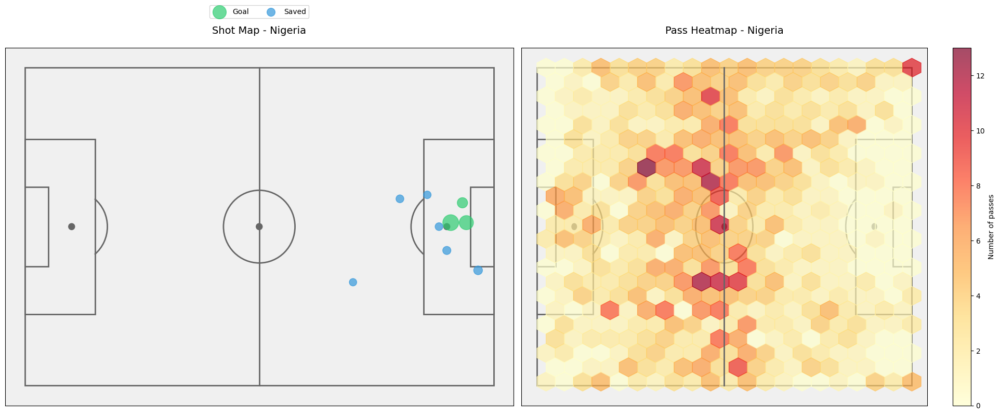

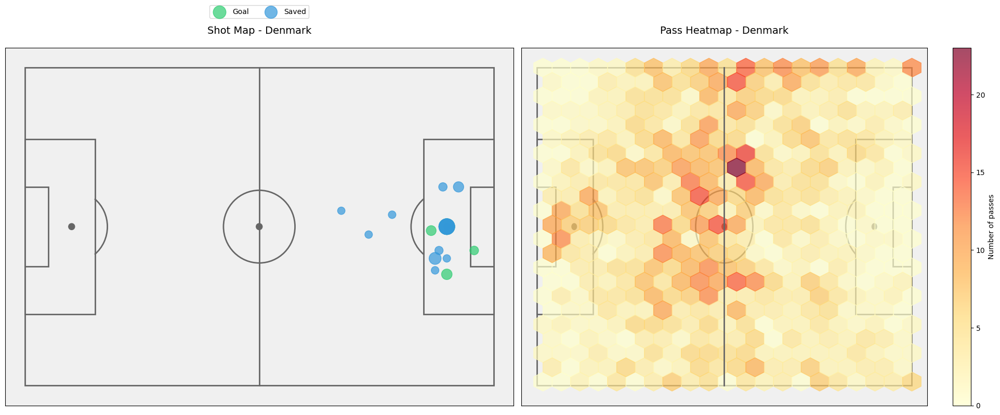

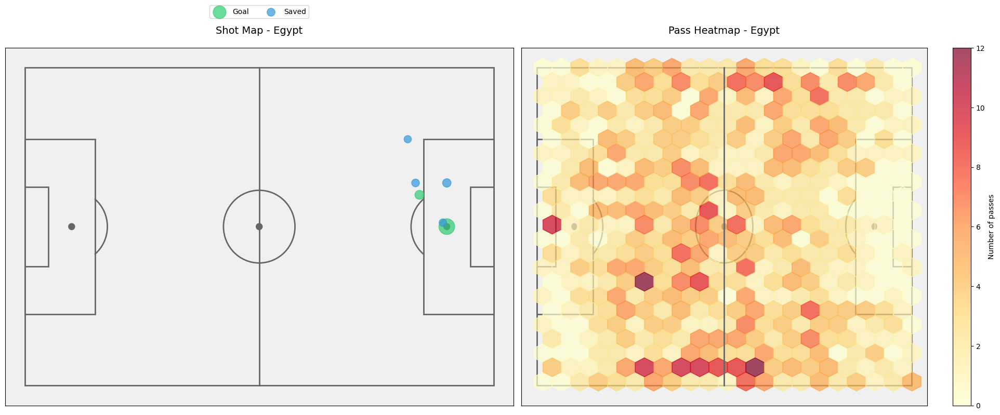

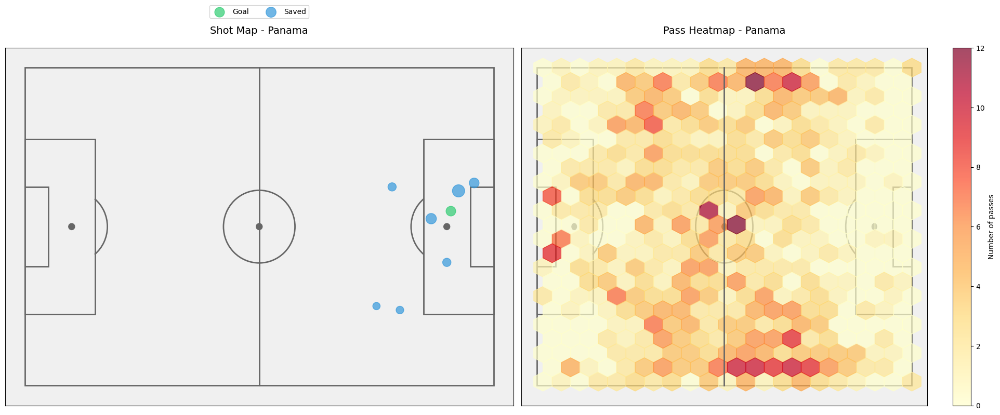

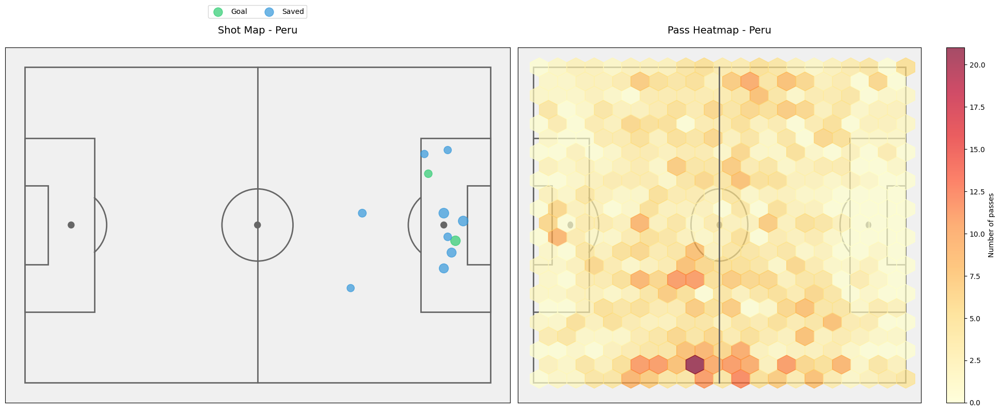

In [9]:
import pandas as pd
import json
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Rectangle
import seaborn as sns
from pathlib import Path

def load_and_process_data(data_dir='/kaggle/input'):
    """Load and process match event data"""
    all_events = []
    
    # Process all JSON files except competitions.json
    for file_path in Path(data_dir).glob('*.json'):
        if file_path.name != 'competitions.json':
            with open(file_path, 'r', encoding='utf-8') as f:
                match_events = json.load(f)
                all_events.extend(match_events)
    
    return pd.DataFrame(all_events)

def draw_soccer_pitch(ax, pitch_color='#f0f0f0', line_color='#666666'):
    """Draw a soccer pitch with improved aesthetics"""
    # Background
    ax.set_facecolor(pitch_color)
    
    # Add full pitch outline
    ax.add_patch(Rectangle((0, 0), 120, 80, facecolor=pitch_color, edgecolor=line_color, lw=2))

    # Halfway line
    ax.plot([60, 60], [0, 80], color=line_color, lw=2)
    
    # Center circle
    center_circle = plt.Circle((60, 40), 9.15, color=line_color, fill=False, lw=2)
    ax.add_patch(center_circle)
    
    # Center spot
    center_spot = plt.Circle((60, 40), 0.8, color=line_color)
    ax.add_patch(center_spot)

    # Both penalty areas
    ax.add_patch(Rectangle((0, 18), 18, 44, facecolor=pitch_color, edgecolor=line_color, lw=2))
    ax.add_patch(Rectangle((102, 18), 18, 44, facecolor=pitch_color, edgecolor=line_color, lw=2))

    # Both 6-yard boxes
    ax.add_patch(Rectangle((0, 30), 6, 20, facecolor=pitch_color, edgecolor=line_color, lw=2))
    ax.add_patch(Rectangle((114, 30), 6, 20, facecolor=pitch_color, edgecolor=line_color, lw=2))

    # Penalty spots
    ax.add_patch(plt.Circle((12, 40), 0.8, color=line_color))
    ax.add_patch(plt.Circle((108, 40), 0.8, color=line_color))

    # Penalty arcs
    left_arc = Arc((12, 40), height=18.3, width=18.3, angle=0, theta1=310, theta2=50, color=line_color, lw=2)
    right_arc = Arc((108, 40), height=18.3, width=18.3, angle=0, theta1=130, theta2=230, color=line_color, lw=2)
    ax.add_patch(left_arc)
    ax.add_patch(right_arc)

    # Set up the display
    ax.set_xlim(-5, 125)
    ax.set_ylim(-5, 85)
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Remove axis labels
    ax.set_xlabel('')
    ax.set_ylabel('')

def plot_team_positions(events_df, team_name=None):
    """Plot team's shot and pass positions with improved visualization"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    fig.set_facecolor('white')
    
    # Filter for specific team if provided
    if team_name:
        team_events = events_df[
            events_df['team'].apply(
                lambda x: isinstance(x, dict) and x.get('name') == team_name
            )
        ]
    else:
        team_events = events_df
    
    # Draw pitches
    draw_soccer_pitch(ax1)
    draw_soccer_pitch(ax2)
    
    # Plot shots
    shots = []
    for _, event in team_events.iterrows():
        if isinstance(event.get('type', {}), dict) and event['type'].get('name') == 'Shot':
            if isinstance(event.get('location'), list):
                shots.append({
                    'x': event['location'][0],
                    'y': event['location'][1],
                    'outcome': event.get('shot', {}).get('outcome', {}).get('name'),
                    'xg': event.get('shot', {}).get('statsbomb_xg', 0.0)
                })
    
    shots_df = pd.DataFrame(shots)
    if not shots_df.empty:
        # Plot shots with size based on xG
        for outcome, (color, label) in zip(
            ['Goal', 'Saved', 'Miss'],
            [('#2ecc71', 'Goal'), ('#3498db', 'Saved'), ('#e74c3c', 'Miss')]
        ):
            mask = shots_df['outcome'] == outcome
            if mask.any():
                size = shots_df[mask]['xg'] * 500 + 100  # Scale size based on xG
                ax1.scatter(shots_df[mask]['x'], shots_df[mask]['y'],
                          c=color, s=size, alpha=0.7, label=label)
    
    # Plot passes heatmap
    passes = []
    for _, event in team_events.iterrows():
        if isinstance(event.get('type', {}), dict) and event['type'].get('name') == 'Pass':
            if isinstance(event.get('location'), list):
                passes.append({
                    'x': event['location'][0],
                    'y': event['location'][1]
                })
    
    passes_df = pd.DataFrame(passes)
    if not passes_df.empty:
        hb = ax2.hexbin(passes_df['x'], passes_df['y'],
                       gridsize=20, cmap='YlOrRd',
                       alpha=0.7)
        plt.colorbar(hb, ax=ax2, label='Number of passes')
    
    # Titles and styling
    team_title = f" - {team_name}" if team_name else ""
    ax1.set_title(f'Shot Map{team_title}', size=14, pad=20)
    ax2.set_title(f'Pass Heatmap{team_title}', size=14, pad=20)
    
    # Legend for shots
    ax1.legend(loc='upper center', bbox_to_anchor=(0.5, 1.13),
              ncol=3, frameon=True, facecolor='white')
    
    plt.tight_layout()
    plt.show()

def main():
    # Load and process data
    events_df = load_and_process_data()
    
    # Plot position analysis for all teams
    plot_team_positions(events_df)
    
    # Example: Plot for a specific team
    teams = events_df['team'].apply(lambda x: x.get('name') if isinstance(x, dict) else None).unique()
    for team in teams:
        if team:  # Only plot if team name is not None
            plot_team_positions(events_df, team)
    
    return events_df

if __name__ == "__main__":
    events_df = main()

## Code Explanation

This script performs a comprehensive analysis of player performance using event data from StatsBomb. It processes raw JSON event files to compute individual statistics, visualizes key performance metrics, and analyzes trends by player position.

### 1. Data Loading & Processing
- **Function:** `load_and_process_player_data()`
- **Process:**
  - Iterates over all JSON files in the specified data directory (ignoring `competitions.json`).
  - For each match file, it processes every event to:
    - Extract player information (name, team, position).
    - Update counters for various events such as **shots**, **goals**, **passes**, **assists**, **successful passes**, **key passes**, **tackles**, and **interceptions**.
    - Track the number of matches each player has participated in.
  - After processing all events, it computes additional metrics:
    - **Pass Accuracy:** Ratio of successful passes to total passes.
    - **Goals per Match** and **Assists per Match.**
  - The aggregated data is converted into a Pandas DataFrame for further analysis.

### 2. Visualization of Player Analysis
- **Function:** `plot_player_analysis(player_stats)`
- **Visualizations:**
  - **Top 10 Goal Scorers:** Bar plot of players with the most goals.
  - **Top 10 Assisters:** Bar plot of players with the highest assists.
  - **Top 10 Pass Accuracy (min. 100 passes):** Bar plot showing players with the best pass accuracy among those with at least 100 passes.
  - **Top 10 Goal Contributions per Match:** Bar plot combining goals and assists per match.
- **Styling:** Uses Seaborn with the Viridis palette for a clean and modern look.

### 3. Detailed Player Statistics Printing
- **Function:** `print_player_stats(player_stats)`
- **Output:**
  - Prints the top 5 players in key categories:
    - **Goal Scorers**
    - **Assisters**
    - **Pass Accuracy** (for players with at least 100 passes)
    - **Key Passes**
- This provides a quick textual summary of the best performers in each category.

### 4. Analysis by Player Position
- **Function:** `analyze_by_position(player_stats)`
- **Process:**
  - Groups player statistics by their position.
  - Calculates the average values for goals, assists, pass accuracy, tackles, and interceptions.
  - Visualizes the average statistics per position using a bar chart to highlight performance trends across different roles.

### 5. Main Workflow
- **Function:** `main()`
- **Workflow:**
  - Loads and processes player data.
  - Prints detailed player statistics.
  - Generates visualizations for individual performance metrics.
  - Performs and visualizes a position-based analysis.
  - Returns the processed player statistics DataFrame for further use or analysis.

Overall, this script integrates data processing, statistical summarization, and visualization to provide valuable insights into player performance, identifying top performers and revealing trends across different playing positions.


Processing 7541.json...
Processing 7534.json...
Processing 23.json...
Processing 4.json...
Processing 8652.json...
Processing 7584.json...
Processing 7583.json...
Processing 7530.json...
Processing 7537.json...
Processing 40.json...
Processing 7561.json...
Processing 38.json...
Processing 8656.json...
Processing 26.json...
Processing 2.json...
Processing 7548.json...
Processing 42.json...
Processing 7568.json...
Processing 7525.json...
Processing 3.json...
Processing 7555.json...
Processing 7533.json...
Processing 8649.json...
Processing 7576.json...
Processing 7565.json...
Processing 37.json...
Processing 7553.json...
Processing 22.json...
Processing 39.json...
Processing 7586.json...
Processing 7556.json...
Processing 7544.json...
Processing 7582.json...
Processing 8657.json...
Processing 7577.json...
Processing 25.json...
Processing 8655.json...
Processing 7580.json...
Processing 7560.json...
Processing 7579.json...
Processing 7543.json...
Processing 8658.json...
Processing 7572.jso

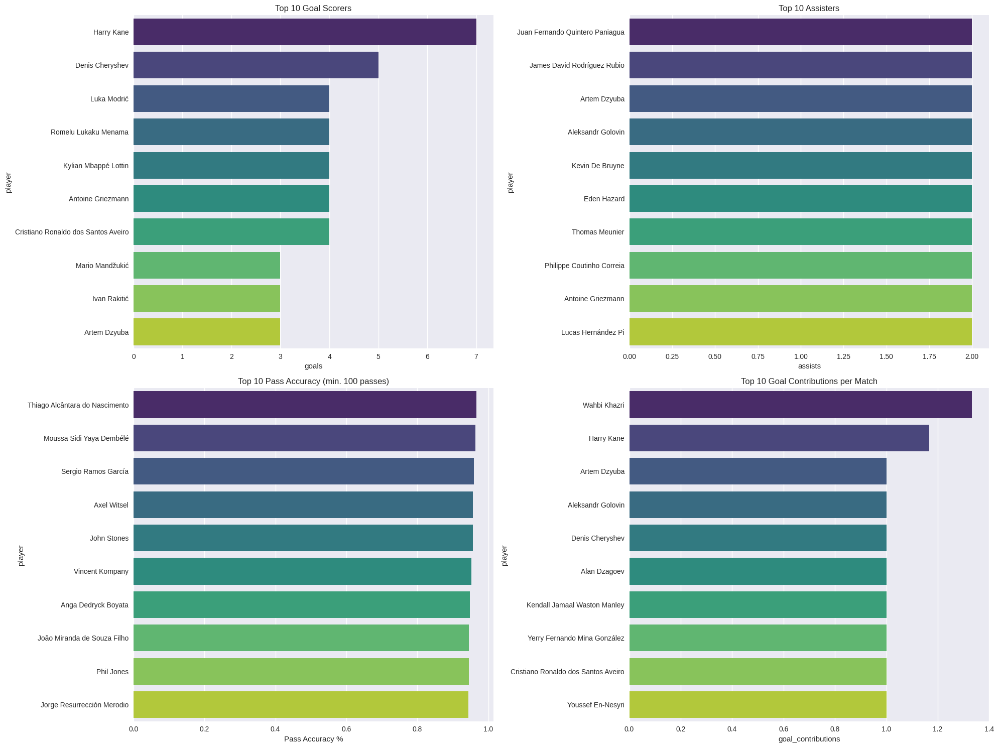


Average Statistics by Position:
                           goals  assists  pass_accuracy  tackles  \
position                                                            
Center Attacking Midfield   0.67     0.48           0.81     3.95   
Center Back                 0.33     0.00           0.92     2.78   
Center Defensive Midfield   0.13     0.13           0.87     5.40   
Center Forward              0.62     0.21           0.65     1.38   
Center Midfield             0.00     0.00           0.80     0.33   
Goalkeeper                  0.00     0.00           0.69     0.00   
Left Attacking Midfield     1.00     1.00           0.80     5.50   
Left Back                   0.07     0.11           0.78     3.61   
Left Center Back            0.33     0.07           0.86     3.30   
Left Center Forward         1.04     0.17           0.76     1.71   
Left Center Midfield        0.18     0.18           0.87     3.92   
Left Defensive Midfield     0.11     0.22           0.86     7.22   
L

<Figure size 1500x1000 with 0 Axes>

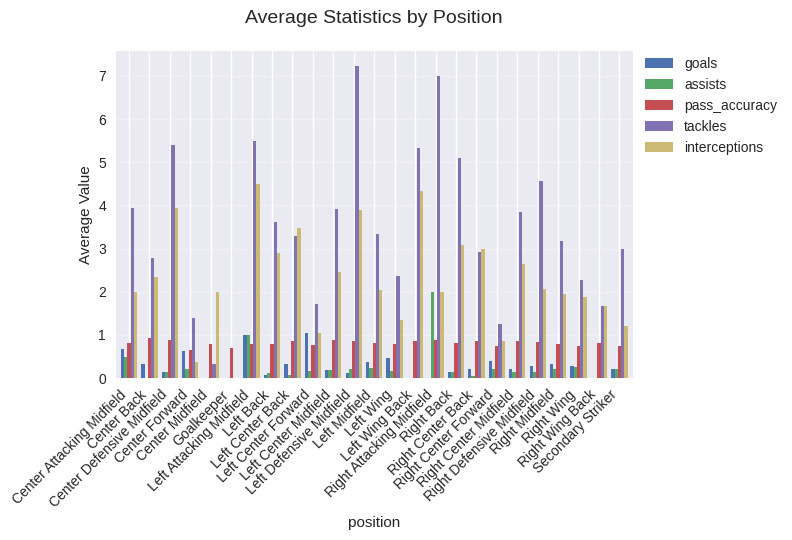

In [10]:
import pandas as pd
import json
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from collections import defaultdict

def load_and_process_player_data():
    """Load and process player statistics from event data"""
    player_stats = defaultdict(lambda: {
        'shots': 0,
        'goals': 0,
        'passes': 0,
        'assists': 0,
        'minutes_played': 0,
        'matches': set(),
        'team': None,
        'position': None,
        'successful_passes': 0,
        'key_passes': 0,
        'tackles': 0,
        'interceptions': 0
    })
    
    for file_path in Path(DATA_DIR).glob('*.json'):
        if file_path.name == 'competitions.json':
            continue
            
        print(f"Processing {file_path.name}...")
        with open(file_path, 'r', encoding='utf-8') as f:
            events = json.load(f)
            match_id = file_path.stem
            
            # Track player minutes
            for event in events:
                if isinstance(event.get('player'), dict):
                    player_id = event['player']['id']
                    player_name = event['player']['name']
                    
                    # Update team and position if available
                    if isinstance(event.get('team'), dict):
                        player_stats[player_name]['team'] = event['team']['name']
                    
                    if isinstance(event.get('position'), dict):
                        player_stats[player_name]['position'] = event['position']['name']
                    
                    # Track matches played
                    player_stats[player_name]['matches'].add(match_id)
                    
                    # Process different event types
                    if isinstance(event.get('type'), dict):
                        event_type = event['type']['name']
                        
                        if event_type == 'Shot':
                            player_stats[player_name]['shots'] += 1
                            if event.get('shot', {}).get('outcome', {}).get('name') == 'Goal':
                                player_stats[player_name]['goals'] += 1
                                
                        elif event_type == 'Pass':
                            player_stats[player_name]['passes'] += 1
                            if not event.get('pass', {}).get('outcome', {}).get('name') == 'Incomplete':
                                player_stats[player_name]['successful_passes'] += 1
                            if event.get('pass', {}).get('goal_assist'):
                                player_stats[player_name]['assists'] += 1
                            if event.get('pass', {}).get('shot_assist'):
                                player_stats[player_name]['key_passes'] += 1
                                
                        elif event_type == 'Interception':
                            player_stats[player_name]['interceptions'] += 1
                            
                        elif event_type == 'Duel' and event.get('duel', {}).get('type', {}).get('name') == 'Tackle':
                            player_stats[player_name]['tackles'] += 1
    
    # Convert to DataFrame
    players_list = []
    for player, stats in player_stats.items():
        matches_played = len(stats['matches'])
        stats_dict = {
            'player': player,
            'team': stats['team'],
            'position': stats['position'],
            'matches_played': matches_played,
            'goals': stats['goals'],
            'assists': stats['assists'],
            'shots': stats['shots'],
            'passes': stats['passes'],
            'pass_accuracy': stats['successful_passes'] / stats['passes'] if stats['passes'] > 0 else 0,
            'key_passes': stats['key_passes'],
            'tackles': stats['tackles'],
            'interceptions': stats['interceptions'],
            'goals_per_match': stats['goals'] / matches_played if matches_played > 0 else 0,
            'assists_per_match': stats['assists'] / matches_played if matches_played > 0 else 0
        }
        players_list.append(stats_dict)
    
    return pd.DataFrame(players_list)

def plot_player_analysis(player_stats):
    """Create visualizations for player statistics"""
    plt.style.use('seaborn')
    fig, axes = plt.subplots(2, 2, figsize=(20, 15))
    
    # Top Scorers
    top_scorers = player_stats.nlargest(10, 'goals')
    sns.barplot(data=top_scorers, x='goals', y='player', ax=axes[0,0], palette='viridis')
    axes[0,0].set_title('Top 10 Goal Scorers', fontsize=12)
    
    # Top Assisters
    top_assisters = player_stats.nlargest(10, 'assists')
    sns.barplot(data=top_assisters, x='assists', y='player', ax=axes[0,1], palette='viridis')
    axes[0,1].set_title('Top 10 Assisters', fontsize=12)
    
    # Pass Accuracy (minimum 100 passes)
    pass_accuracy = player_stats[player_stats['passes'] >= 100].nlargest(10, 'pass_accuracy')
    sns.barplot(data=pass_accuracy, x='pass_accuracy', y='player', ax=axes[1,0], palette='viridis')
    axes[1,0].set_title('Top 10 Pass Accuracy (min. 100 passes)', fontsize=12)
    axes[1,0].set_xlabel('Pass Accuracy %')
    
    # Goals + Assists per Match
    player_stats['goal_contributions'] = player_stats['goals_per_match'] + player_stats['assists_per_match']
    top_contributors = player_stats.nlargest(10, 'goal_contributions')
    sns.barplot(data=top_contributors, x='goal_contributions', y='player', ax=axes[1,1], palette='viridis')
    axes[1,1].set_title('Top 10 Goal Contributions per Match', fontsize=12)
    
    plt.tight_layout()
    plt.show()

def print_player_stats(player_stats):
    """Print detailed player statistics"""
    print("\nTop Goal Scorers:")
    print(player_stats.nlargest(5, 'goals')[['player', 'team', 'goals', 'matches_played']])
    
    print("\nTop Assisters:")
    print(player_stats.nlargest(5, 'assists')[['player', 'team', 'assists', 'matches_played']])
    
    print("\nBest Pass Accuracy (min. 100 passes):")
    min_passes = player_stats[player_stats['passes'] >= 100]
    print(min_passes.nlargest(5, 'pass_accuracy')[
        ['player', 'team', 'pass_accuracy', 'passes']])
    
    print("\nMost Key Passes:")
    print(player_stats.nlargest(5, 'key_passes')[
        ['player', 'team', 'key_passes', 'matches_played']])

def analyze_by_position(player_stats):
    """Analyze statistics by player position"""
    position_stats = player_stats.groupby('position').agg({
        'goals': 'mean',
        'assists': 'mean',
        'pass_accuracy': 'mean',
        'tackles': 'mean',
        'interceptions': 'mean'
    }).round(2)
    
    print("\nAverage Statistics by Position:")
    print(position_stats)
    
    # Visualize position-based statistics
    plt.figure(figsize=(15, 10))  # Yüksekliği artırdık
    ax = position_stats.plot(kind='bar', width=0.8)
    
    plt.title('Average Statistics by Position', pad=20, size=14)
    
    # Etiketleri döndür ve aralığı ayarla
    plt.xticks(rotation=45, ha='right')
    
    # Legend'ı grafiğin üstüne taşı
    plt.legend(bbox_to_anchor=(1.0, 1.02), loc='upper left')
    
    # Grid çizgilerini ekle
    plt.grid(True, axis='y', alpha=0.3)
    
    # Kenar boşluklarını ayarla
    plt.tight_layout()
    
    # Y ekseni etiketini ekle
    plt.ylabel('Average Value')
    
    plt.show()
def main():
    # Load and process player data
    player_stats = load_and_process_player_data()
    
    # Print player statistics
    print_player_stats(player_stats)
    
    # Plot player analysis
    plot_player_analysis(player_stats)
    
    # Analyze by position
    analyze_by_position(player_stats)
    
    return player_stats

if __name__ == "__main__":
    player_stats = main()

## Code Explanation

This script performs an in-depth analysis of shot events using StatsBomb event data. It loads match events from JSON files, extracts shot-specific information, and creates multiple visualizations to explore shot outcomes, expected goals (xG), shot success by field zones, and various other shot-related metrics.

### 1. Creating the Soccer Pitch
- **Function:** `create_pitch(ax)`
  - Draws a football pitch with official dimensions (120x80) using Matplotlib shapes.
  - Adds key features such as:
    - The main pitch outline.
    - Left and right penalty areas.
    - 6-yard boxes.
    - Halfway line and center circle.
    - Penalty arcs and penalty spots.
  - Sets the axis limits and removes ticks for a clean visualization.

### 2. Analyzing Shot Events
- **Function:** `analyze_shots(events_df)`
  - Iterates over the events DataFrame to extract events of type "Shot".
  - For each shot event, it collects:
    - The shot location (x, y).
    - The team and player names.
    - The shot outcome (e.g., Goal, Saved, Off T, etc.).
    - The xG value.
    - Additional details like shot technique and the body part used.
  - Compiles all extracted information into a new DataFrame (`shots_df`).
  - Prints out the unique shot techniques used in the dataset for further insight.

### 3. Visualizing Shot Analysis
- **Function:** `plot_shot_analysis(shots_df)`
  - Sets up a large figure with a grid of six subplots for various analyses:
    
    1. **Shot Map by Outcome (ax1):**
       - Draws the pitch and plots each shot, color-coded by its outcome (e.g., Goal, Saved, Off T, etc.).
       - Uses a legend to identify the outcomes.

    2. **xG Heatmap (ax2):**
       - Draws the pitch and overlays a hexbin plot that averages the xG values in each cell.
       - A colorbar indicates the expected goals values.

    3. **Shot Success Rate by Zone (ax3):**
       - Divides the pitch into zones by segmenting the x and y coordinates.
       - Calculates the success rate (proportion of shots resulting in goals) for each zone.
       - Annotates each zone with its success rate percentage.

    4. **Body Part Analysis (ax4):**
       - Groups shots by the body part used to take the shot.
       - Plots a horizontal bar chart of the goal conversion rate and mean xG by body part.

    5. **Top Scorers (ax5):**
       - Aggregates shot data by player to sum up total goals and xG.
       - Displays the top 10 scorers in a horizontal bar chart.

    6. **Shot Technique Analysis (ax6):**
       - Groups data by shot technique.
       - Plots a horizontal bar chart showing the success rate (goal conversion) by shot technique.

  - After plotting, the function adjusts layout spacing and prints overall shot statistics:
    - Total number of shots.
    - Total goals scored.
    - Overall conversion rate.
    - Average xG per shot.

### 4. Main Workflow
- **Function:** `main()`
  - Loads event data from all JSON files in the specified data directory (`/kaggle/input`), skipping `competitions.json`.
  - Concatenates all events into a single DataFrame.
  - Reports the total number of loaded events.
  - Calls `analyze_shots` to extract shot events into `shots_df`.
  - Invokes `plot_shot_analysis` to create the detailed visualizations.
  - Returns the `shots_df` DataFrame for further analysis if needed.

Finally, when the script is executed as the main program, it processes the data and displays the comprehensive shot analysis visualizations.


Processing 7541.json...
Processing 7534.json...
Processing 23.json...
Processing 4.json...
Processing 8652.json...
Processing 7584.json...
Processing 7583.json...
Processing 7530.json...
Processing 7537.json...
Processing 40.json...
Processing 7561.json...
Processing 38.json...
Processing 8656.json...
Processing 26.json...
Processing 2.json...
Processing 7548.json...
Processing 42.json...
Processing 7568.json...
Processing 7525.json...
Processing 3.json...
Processing 7555.json...
Processing 7533.json...
Processing 8649.json...
Processing 7576.json...
Processing 7565.json...
Processing 37.json...
Processing 7553.json...
Processing 22.json...
Processing 39.json...
Processing 7586.json...
Processing 7556.json...
Processing 7544.json...
Processing 7582.json...
Processing 8657.json...
Processing 7577.json...
Processing 25.json...
Processing 8655.json...
Processing 7580.json...
Processing 7560.json...
Processing 7579.json...
Processing 7543.json...
Processing 8658.json...
Processing 7572.jso

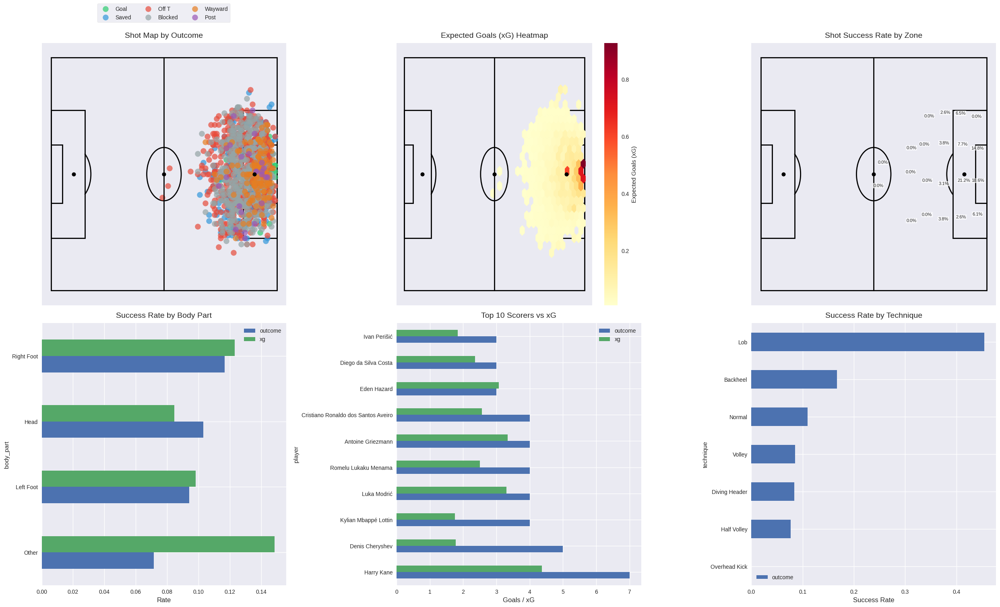


Shot Statistics Summary:
Total Shots: 1706
Goals Scored: 183
Overall Conversion Rate: 10.73%
Average xG per Shot: 0.109


In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Rectangle, Circle
import seaborn as sns
from pathlib import Path

# Data path settings
DATA_DIR = '/kaggle/input'

def create_pitch(ax):
    """Create a football pitch with proper dimensions"""
    # Pitch dimensions
    pitch_length = 120
    pitch_width = 80

    # Main pitch outline
    pitch_rect = Rectangle((0, 0), pitch_length, pitch_width, 
                          fill=False, color='black', linewidth=2)
    ax.add_patch(pitch_rect)

    # Left penalty area
    left_penalty = Rectangle((0, 18), 18, 44, fill=False, color='black', linewidth=2)
    ax.add_patch(left_penalty)

    # Right penalty area
    right_penalty = Rectangle((102, 18), 18, 44, fill=False, color='black', linewidth=2)
    ax.add_patch(right_penalty)

    # Left 6-yard box
    left_six_yard = Rectangle((0, 30), 6, 20, fill=False, color='black', linewidth=2)
    ax.add_patch(left_six_yard)

    # Right 6-yard box
    right_six_yard = Rectangle((114, 30), 6, 20, fill=False, color='black', linewidth=2)
    ax.add_patch(right_six_yard)

    # Halfway line
    ax.plot([60, 60], [0, 80], color='black', linewidth=2)

    # Center circle
    center_circle = Circle((60, 40), 9.15, fill=False, color='black', linewidth=2)
    ax.add_patch(center_circle)

    # Penalty arcs
    left_arc = Arc((12, 40), height=18.3, width=18.3, angle=0, 
                   theta1=310, theta2=50, color='black', linewidth=2)
    right_arc = Arc((108, 40), height=18.3, width=18.3, angle=0, 
                    theta1=130, theta2=230, color='black', linewidth=2)
    ax.add_patch(left_arc)
    ax.add_patch(right_arc)

    # Penalty spots
    ax.plot([12, 12], [40, 40], 'ko')
    ax.plot([108, 108], [40, 40], 'ko')

    # Center spot
    ax.plot([60, 60], [40, 40], 'ko')

    # Set axis limits and remove ticks
    ax.set_xlim(-5, 125)
    ax.set_ylim(-5, 85)
    ax.set_xticks([])
    ax.set_yticks([])

def analyze_shots(events_df):
    """Analyze shot data from events"""
    shots = []
    
    for _, event in events_df.iterrows():
        if isinstance(event['type'], dict) and event['type'].get('name') == 'Shot':
            if isinstance(event['location'], list):
                shot_info = {
                    'x': event['location'][0],
                    'y': event['location'][1],
                    'team': event['team']['name'] if isinstance(event['team'], dict) else None,
                    'player': event['player']['name'] if isinstance(event['player'], dict) else None,
                    'outcome': event.get('shot', {}).get('outcome', {}).get('name', 'Unknown'),
                    'xg': event.get('shot', {}).get('statsbomb_xg', 0),
                    'technique': event.get('shot', {}).get('technique', {}).get('name', 'Unknown'),
                    'body_part': event.get('shot', {}).get('body_part', {}).get('name', 'Unknown')
                }
                shots.append(shot_info)
    
    shots_df = pd.DataFrame(shots)
    
    # Mevcut teknikleri göster
    print("\nUnique Shot Techniques:")
    print(shots_df['technique'].value_counts())
    
    return shots_df

def plot_shot_analysis(shots_df):
    """Create comprehensive shot analysis visualizations"""
    # Figure boyutunu artır
    fig = plt.figure(figsize=(25, 15))
    
    # Grid düzenini değiştir
    ax1 = plt.subplot2grid((2, 3), (0, 0), colspan=1, rowspan=1)
    ax2 = plt.subplot2grid((2, 3), (0, 1), colspan=1, rowspan=1)
    ax3 = plt.subplot2grid((2, 3), (0, 2), colspan=1, rowspan=1)
    ax4 = plt.subplot2grid((2, 3), (1, 0), colspan=1, rowspan=1)
    ax5 = plt.subplot2grid((2, 3), (1, 1), colspan=1, rowspan=1)
    ax6 = plt.subplot2grid((2, 3), (1, 2), colspan=1, rowspan=1)
    
    # Font boyutunu artır
    plt.rcParams.update({'font.size': 12})
    
    # 1. Shot Map with outcomes
    create_pitch(ax1)
    outcomes = {
        'Goal': '#2ecc71',
        'Saved': '#3498db',
        'Off T': '#e74c3c',
        'Blocked': '#95a5a6',
        'Wayward': '#e67e22',
        'Post': '#9b59b6'
    }
    
    for outcome, color in outcomes.items():
        mask = shots_df['outcome'] == outcome
        if mask.any():
            ax1.scatter(shots_df[mask]['x'], shots_df[mask]['y'], 
                       c=color, alpha=0.7, s=100, label=outcome)
    
    ax1.set_title('Shot Map by Outcome', pad=10, size=14)
    ax1.legend(loc='upper center', bbox_to_anchor=(0.5, 1.15), 
              ncol=3, fontsize=10, frameon=True, 
              borderaxespad=0.)

    # 2. xG Heatmap
    create_pitch(ax2)
    
    hb = ax2.hexbin(shots_df['x'], shots_df['y'], C=shots_df['xg'],
                    gridsize=20, cmap='YlOrRd', reduce_C_function=np.mean)
    plt.colorbar(hb, ax=ax2, label='Expected Goals (xG)')
    ax2.set_title('Expected Goals (xG) Heatmap', pad=10, size=14)

    # 3. Shot Success Rate by Zone
    create_pitch(ax3)
    
    shots_df['zone_x'] = pd.cut(shots_df['x'], bins=6, labels=['A','B','C','D','E','F'])
    shots_df['zone_y'] = pd.cut(shots_df['y'], bins=4, labels=['1','2','3','4'])
    shots_df['zone'] = shots_df['zone_x'].astype(str) + shots_df['zone_y'].astype(str)
    
    zone_stats = shots_df.groupby('zone').agg({
        'outcome': lambda x: sum(x == 'Goal') / len(x)
    }).reset_index()
    
    # Yüzdeleri gösterirken offset ekle
    offset_x = 2
    offset_y = 2
    
    for _, zone in zone_stats.iterrows():
        x_pos = shots_df[shots_df['zone'] == zone['zone']]['x'].mean()
        y_pos = shots_df[shots_df['zone'] == zone['zone']]['y'].mean()
        success_rate = zone['outcome']
        if not np.isnan(x_pos) and not np.isnan(y_pos):
            ax3.text(x_pos + offset_x, y_pos + offset_y, 
                    f'{success_rate:.1%}', 
                    ha='center', va='center', 
                    fontsize=8,
                    bbox=dict(facecolor='white', 
                             alpha=0.7,
                             edgecolor='none',
                             pad=1))
    
    ax3.set_title('Shot Success Rate by Zone', pad=10, size=14)

    # 4. Body Part Analysis
    body_part_stats = shots_df.groupby('body_part').agg({
        'outcome': lambda x: sum(x == 'Goal') / len(x),
        'xg': 'mean'
    }).sort_values('outcome', ascending=True)
    
    body_part_stats.plot(kind='barh', ax=ax4)
    ax4.set_title('Success Rate by Body Part', pad=10, size=14)
    ax4.set_xlabel('Rate', size=12)

    # 5. Top Scorers
    player_stats = shots_df.groupby('player').agg({
        'outcome': lambda x: sum(x == 'Goal'),
        'xg': 'sum'
    }).sort_values('outcome', ascending=False).head(10)
    
    player_stats.plot(kind='barh', ax=ax5)
    ax5.set_title('Top 10 Scorers vs xG', pad=10, size=14)
    ax5.set_xlabel('Goals / xG', size=12)

    # 6. Shot Technique Analysis
    technique_stats = shots_df.groupby('technique').agg({
        'outcome': lambda x: sum(x == 'Goal') / len(x)
    }).sort_values('outcome', ascending=True)
    
    technique_stats.plot(kind='barh', ax=ax6)
    ax6.set_title('Success Rate by Technique', pad=10, size=14)
    ax6.set_xlabel('Success Rate', size=12)

    # Alt grafikler arasındaki boşlukları ayarla
    plt.subplots_adjust(hspace=0.4, wspace=0.3)
    
    plt.tight_layout()
    plt.show()

    # Print additional statistics
    print("\nShot Statistics Summary:")
    print(f"Total Shots: {len(shots_df)}")
    print(f"Goals Scored: {sum(shots_df['outcome'] == 'Goal')}")
    print(f"Overall Conversion Rate: {sum(shots_df['outcome'] == 'Goal') / len(shots_df):.2%}")
    print(f"Average xG per Shot: {shots_df['xg'].mean():.3f}")

def main():
    # Load event data
    events_df = pd.DataFrame()
    
    # Veri yükleme
    for file_path in Path(DATA_DIR).glob('*.json'):
        if file_path.name == 'competitions.json':
            continue
            
        print(f"Processing {file_path.name}...")
        with open(file_path, 'r', encoding='utf-8') as f:
            events = json.load(f)
            events_df = pd.concat([events_df, pd.DataFrame(events)])
    
    print(f"Loaded {len(events_df)} total events")
    
    # Analyze shots
    shots_df = analyze_shots(events_df)
    
    # Create visualizations
    plot_shot_analysis(shots_df)
    
    return shots_df

if __name__ == "__main__":
    shots_df = main()

## Code Explanation

This script builds and analyzes a passing network from match event data, focusing on a selected team. It loads JSON event files, extracts passing events, constructs a directed network of passes between players, computes centrality metrics, and visualizes the network on a drawn football pitch.

### 1. Data Loading
- **`load_matches()`**
  - Iterates over all JSON files in the designated data directory (excluding `competitions.json`).
  - Loads each file’s content and concatenates the events into a single Pandas DataFrame.
  - Returns the complete events DataFrame for further analysis.

### 2. Extracting Team Names
- **`get_team_names(events_df)`**
  - Scans the events DataFrame to extract unique team names from the `team` field.
  - Returns a sorted list of team names available in the dataset.

### 3. Drawing the Soccer Pitch
- **`create_pitch(ax)`**
  - Uses Matplotlib to draw a football pitch with correct dimensions (120x80).
  - Adds key elements such as:
    - The pitch background (with a green color overlay).
    - Boundaries, halfway line, center circle, penalty areas, and goal areas.
  - Sets axis limits and removes ticks to create a clean background for network visualization.

### 4. Building the Passing Network
- **`build_passing_network(events_df, team_name)`**
  - Filters the events DataFrame for pass events related to the selected team.
  - Iterates through these events to:
    - Record the source (passing player) and target (recipient) of each pass.
    - Collect positional data from the event locations to later compute average positions for each player.
  - Constructs a directed graph (using NetworkX) where:
    - **Nodes** represent players.
    - **Edges** represent passes, with the weight indicating the number of passes between two players.
  - Calculates average positions for each player (converting StatsBomb coordinates to pitch coordinates) and sets these as node attributes.
  - Prints summary statistics such as the total number of passes, nodes, and edges.

### 5. Analyzing the Network
- **`analyze_network(G)`**
  - Computes two key centrality measures for the passing network:
    - **Degree Centrality:** Indicates how many passes a player is involved in (both as passer and receiver).
    - **Betweenness Centrality:** Highlights players who act as key connectors within the network.
  - Returns sorted lists of players based on these centrality metrics.

### 6. Visualizing the Passing Network
- **`visualize_network(G, title)`**
  - Draws the football pitch using `create_pitch`.
  - Retrieves node positions (or computes a layout if positions are missing).
  - Sets node sizes based on each player's degree and edge widths based on pass counts.
  - Uses NetworkX drawing functions to render nodes, edges, and labels, producing a clear visual representation of the passing network.
  - Displays the network with an appropriate title.

### 7. Main Workflow
- **`main()`**
  - Calls `load_matches()` to load all match event data.
  - Uses `get_team_names()` to list available teams and prints them.
  - Selects a specific team for analysis (e.g., "Spain").
  - Builds the passing network for the selected team with `build_passing_network()`.
  - Analyzes the network centrality metrics with `analyze_network()` and prints the top players by degree and betwe


Processing 7541.json...
Processing 7534.json...
Processing 23.json...
Processing 4.json...
Processing 8652.json...
Processing 7584.json...
Processing 7583.json...
Processing 7530.json...
Processing 7537.json...
Processing 40.json...
Processing 7561.json...
Processing 38.json...
Processing 8656.json...
Processing 26.json...
Processing 2.json...
Processing 7548.json...
Processing 42.json...
Processing 7568.json...
Processing 7525.json...
Processing 3.json...
Processing 7555.json...
Processing 7533.json...
Processing 8649.json...
Processing 7576.json...
Processing 7565.json...
Processing 37.json...
Processing 7553.json...
Processing 22.json...
Processing 39.json...
Processing 7586.json...
Processing 7556.json...
Processing 7544.json...
Processing 7582.json...
Processing 8657.json...
Processing 7577.json...
Processing 25.json...
Processing 8655.json...
Processing 7580.json...
Processing 7560.json...
Processing 7579.json...
Processing 7543.json...
Processing 8658.json...
Processing 7572.jso

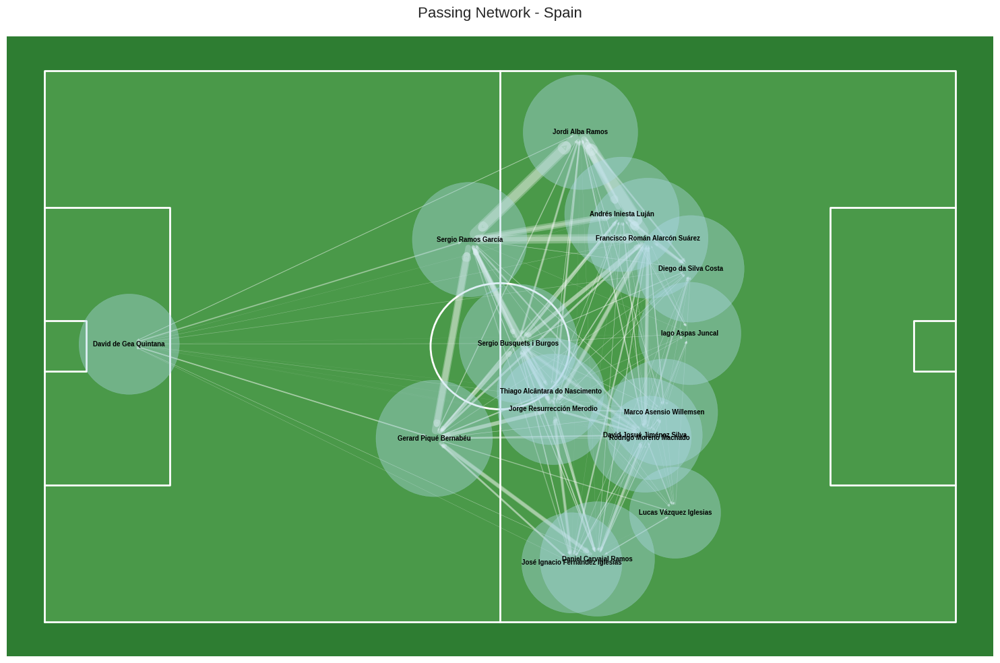

In [12]:
import json
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
from pathlib import Path
from collections import defaultdict
import seaborn as sns

# Data path settings (adjust as needed)
DATA_DIR = '/kaggle/input/'

def load_matches():
    """
    Load match event data from all JSON files (excluding competitions.json) in DATA_DIR.
    Returns a concatenated DataFrame.
    """
    events_df = pd.DataFrame()
    
    for file_path in Path(DATA_DIR).glob('*.json'):
        if file_path.name == 'competitions.json':
            continue
        print(f"Processing {file_path.name}...")
        with open(file_path, 'r', encoding='utf-8') as f:
            events = json.load(f)
            events_df = pd.concat([events_df, pd.DataFrame(events)], ignore_index=True)
    
    return events_df

def get_team_names(events_df):
    """
    List team names present in the events data.
    """
    team_names = set()
    for team in events_df['team'].dropna():
        if isinstance(team, dict) and 'name' in team:
            team_names.add(team['name'])
    return sorted(list(team_names))

def create_pitch(ax):
    """Create a football pitch with proper dimensions"""
    # Pitch dimensions
    pitch_length = 120
    pitch_width = 80

    # Draw a rectangle for the pitch background with a green color
    rect = plt.Rectangle((0, 0), pitch_length, pitch_width, 
                         facecolor='#8BDB81', alpha=0.3)
    ax.add_patch(rect)

    # Draw pitch boundaries in white
    ax.plot([0, 0, pitch_length, pitch_length, 0], 
            [0, pitch_width, pitch_width, 0, 0], 
            color='white', linewidth=2)

    # Halfway line
    ax.plot([pitch_length/2, pitch_length/2], [0, pitch_width], 
            color='white', linewidth=2)

    # Center circle
    center_circle = plt.Circle((pitch_length/2, pitch_width/2), 9.15, 
                               fill=False, color='white', linewidth=2)
    ax.add_artist(center_circle)

    # Penalty areas (drawn as lines)
    ax.plot([0, 16.5, 16.5, 0], [pitch_width/2 - 20.15, pitch_width/2 - 20.15,
                                  pitch_width/2 + 20.15, pitch_width/2 + 20.15], color='white', linewidth=2)
    ax.plot([pitch_length, pitch_length-16.5, pitch_length-16.5, pitch_length],
            [pitch_width/2 - 20.15, pitch_width/2 - 20.15, pitch_width/2 + 20.15,
             pitch_width/2 + 20.15], color='white', linewidth=2)

    # Goals (drawn as lines)
    ax.plot([0, 5.5, 5.5, 0], [pitch_width/2 - 7.32/2, pitch_width/2 - 7.32/2,
                                pitch_width/2 + 7.32/2, pitch_width/2 + 7.32/2], color='white', linewidth=2)
    ax.plot([pitch_length, pitch_length-5.5, pitch_length-5.5, pitch_length],
            [pitch_width/2 - 7.32/2, pitch_width/2 - 7.32/2, pitch_width/2 + 7.32/2,
             pitch_width/2 + 7.32/2], color='white', linewidth=2)

    ax.set_facecolor('#2E7D32')  # Dark green background
    ax.set_xlim(-5, pitch_length + 5)
    ax.set_ylim(-5, pitch_width + 5)
    ax.set_xticks([])
    ax.set_yticks([])

def build_passing_network(events_df, team_name):
    """
    Build a passing network for a specific team.
    Filters pass events, records player positions from event locations,
    and creates a directed graph with pass counts as edge weights.
    """
    G = nx.DiGraph()
    
    # Filter pass events for the given team.
    pass_events = events_df[
        (events_df['team'].apply(lambda x: x.get('name') if isinstance(x, dict) else None) == team_name) & 
        (events_df['type'].apply(lambda x: x.get('name') if isinstance(x, dict) else None) == 'Pass')
    ].copy()
    
    print(f"\nToplam pas sayısı ({team_name}): {len(pass_events)}")
    
    # Dictionary to store player positions
    player_positions = {}
    successful_passes = 0
    
    for _, event in pass_events.iterrows():
        try:
            if isinstance(event['player'], dict) and isinstance(event['pass'], dict):
                source = event['player'].get('name')
                pass_data = event['pass']
                
                # Get recipient name if available
                target = None
                if 'recipient' in pass_data and isinstance(pass_data['recipient'], dict):
                    target = pass_data['recipient'].get('name')
                
                # Record location for source
                if 'location' in event and isinstance(event['location'], list):
                    if source not in player_positions:
                        player_positions[source] = []
                    player_positions[source].append(event['location'])
                
                if source and target:
                    # Add nodes if they don't exist
                    if not G.has_node(source):
                        G.add_node(source)
                    if not G.has_node(target):
                        G.add_node(target)
                    
                    # Update edge weight
                    if G.has_edge(source, target):
                        G[source][target]['weight'] += 1
                    else:
                        G.add_edge(source, target, weight=1)
                    successful_passes += 1
        except Exception as e:
            continue
    
    # Calculate average positions for each player
    avg_positions = {}
    for player, positions in player_positions.items():
        if positions:
            avg_x = sum(pos[0] for pos in positions) / len(positions)
            avg_y = sum(pos[1] for pos in positions) / len(positions)
            # Convert StatsBomb coordinates to pitch coordinates (flip y-axis)
            avg_positions[player] = (avg_x, 80 - avg_y)
    
    # Set the average positions as node attributes
    nx.set_node_attributes(G, avg_positions, 'pos')
    
    print(f"\nBaşarılı pas sayısı: {successful_passes}")
    print(f"Toplam düğüm sayısı: {len(G.nodes())}")
    print(f"Toplam kenar sayısı: {len(G.edges())}")
    
    return G

def analyze_network(G):
    """
    Analyze the passing network by computing degree centrality and betweenness centrality.
    Returns two lists of tuples sorted in descending order.
    """
    if len(G.nodes()) == 0:
        print("Passing network is empty.")
        return None, None
    
    # Compute centralities
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G)
    
    # Sort in descending order
    top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)
    top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)
    
    return top_degree, top_betweenness

def visualize_network(G, title="Passing Network"):
    """
    Visualize the passing network on a drawn pitch.
    """
    if len(G.nodes()) == 0:
        print("\nUYARI: Görselleştirilecek ağ boş!")
        return
        
    plt.figure(figsize=(15, 10))
    
    # Draw the pitch
    ax = plt.gca()
    create_pitch(ax)
    
    # Get node positions
    pos = nx.get_node_attributes(G, 'pos')
    if not pos:
        pos = nx.spring_layout(G)
    
    # Node sizes based on degree (scaled down)
    node_sizes = [500 * (1 + G.degree(n)) for n in G.nodes()]
    # Edge widths based on pass count (scaled down)
    edge_weights = [d['weight'] * 0.1 for (_, _, d) in G.edges(data=True)]
    
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes,
                           node_color='lightblue', alpha=0.4)
    nx.draw_networkx_edges(G, pos, width=edge_weights,
                           edge_color='white', alpha=0.3,
                           arrows=True, arrowsize=5)
    nx.draw_networkx_labels(G, pos, font_size=7,
                            font_weight='bold', font_color='black')
    
    plt.title(title, size=16, pad=20)
    plt.tight_layout()
    plt.show()

def main():
    # Load all match events from all JSON files in DATA_DIR (excluding competitions.json)
    events_df = load_matches()
    
    # List available teams
    team_names = get_team_names(events_df)
    print("\nMevcut Takımlar:")
    for team in team_names:
        print(f"  - {team}")
    
    # Choose a team for analysis (example: Spain)
    team_name = "Spain"
    print(f"\nSelected team: {team_name}")
    
    # Build the passing network for the selected team
    G = build_passing_network(events_df, team_name)
    
    # Analyze the network: degree and betweenness centrality
    top_degree, top_betweenness = analyze_network(G)
    if top_degree and top_betweenness:
        print("\nEn Çok Pas Yapan/Alan Oyuncular (Degree Centrality):")
        for player, value in top_degree:
            print(f"  {player}: {value:.3f}")
            
        print("\nKilit Pas Dağıtıcıları (Betweenness Centrality):")
        for player, value in top_betweenness:
            print(f"  {player}: {value:.3f}")
        
        # Visualize the passing network
        visualize_network(G, title=f"Passing Network - {team_name}")
    else:
        print("Network analysis could not be performed.")
    
    return events_df

if __name__ == '__main__':
    events_df = main()


## Code Explanation

This script performs an analysis of player movements and positioning on the pitch by leveraging event data. It breaks down player actions into spatial data (locations) and categorizes these actions by different zones of the field (defensive, middle, and attacking). The code also generates visualizations such as heatmaps, action distribution charts, and zone distribution graphs to help understand player involvement and movement patterns.

### Key Components

1. **Analyzing Player Movements**
   - **Function:** `analyze_player_movements(events_df, team_name, player_name=None)`
     - **Purpose:**  
       Filters events for a given team (and optionally a specific player) and aggregates each player's action locations and types.
     - **Process:**
       - Filters events to include only those from the specified team.
       - If a specific player is provided, further narrows down the events.
       - Iterates over each event to:
         - Record the player's name, action type (e.g., pass, shot, etc.), and event location.
         - Classify the event into one of three zones based on the x-coordinate:
           - **Defensive zone:** x < 40
           - **Middle zone:** 40 ≤ x < 80
           - **Attacking zone:** x ≥ 80
       - Stores the data in a dictionary (`player_actions`) with keys for locations, action types, and counts for each zone.

2. **Creating a Player Heatmap**
   - **Function:** `create_player_heatmap(locations, title="Player Position Heatmap")`
     - **Purpose:**  
       Generates a heatmap that visualizes where on the pitch a player has been most active.
     - **Process:**
       - Uses the provided list of locations to create a 2D histogram (heatmap).
       - Calls an assumed `create_pitch(ax)` function to draw the pitch background.
       - Inverts the y-coordinates to match the pitch orientation and overlays the heatmap on the pitch.

3. **Analyzing Action Distribution**
   - **Function:** `analyze_action_distribution(player_actions)`
     - **Purpose:**  
       Aggregates and counts the different types of actions performed by each player.
     - **Process:**
       - Iterates through the `player_actions` dictionary.
       - Counts the frequency of each action type for every player.
       - Returns a DataFrame showing the distribution of actions per player.

4. **Visualizing Zone Distribution**
   - **Function:** `visualize_zone_distribution(player_actions)`
     - **Purpose:**  
       Creates a stacked bar chart that shows the percentage of actions a player performs in the defensive, middle, and attacking thirds.
     - **Process:**
       - Extracts zone counts for each player from the `player_actions` dictionary.
       - Calculates the percentage distribution of actions across zones.
       - Plots the data as a stacked bar chart for easy comparison.

5. **Analyzing Overall Player Involvement**
   - **Function:** `analyze_player_involvement(player_actions)`
     - **Purpose:**  
       Computes overall involvement statistics for each player.
     - **Process:**
       - Calculates the total number of actions (based on location entries) for each player.
       - Determines the variety of actions (unique action types) and computes the average positions on the pitch.
       - Compiles these metrics into a DataFrame for further analysis.

### Main Workflow

- **Data Loading:**  
  The script calls a `load_matches()` function (assumed to be defined elsewhere) to load match event data into a DataFrame.

- **Team and Player Filtering:**  
  The analysis is focused on a specific team, here set to `"Spain"`. If `player_name` is left as `None`, all players from Spain are analyzed.

- **Player Movement Analysis:**  
  The `analyze_player_movements` function is used to extract and classify player movements, resulting in a `player_actions` dictionary.

- **Involvement Statistics and Action Distribution:**  
  - The overall involvement of each player (total actions, average positions, and zone distribution) is computed and printed.
  - The distribution of different action types is also printed for further insight.

- **Visualization:**  
  - The zone distribution across players is visualized using a stacked bar chart.
  - For each player with sufficient data points (more than 10 actions), a heatmap of their positions is created to show where they were most active on the pitch.

This comprehensive analysis helps identify where players spend most of their time, what types of actions they perform, and how their activities are distributed across different parts of the pitch.


Processing 7541.json...
Processing 7534.json...
Processing 23.json...
Processing 4.json...
Processing 8652.json...
Processing 7584.json...
Processing 7583.json...
Processing 7530.json...
Processing 7537.json...
Processing 40.json...
Processing 7561.json...
Processing 38.json...
Processing 8656.json...
Processing 26.json...
Processing 2.json...
Processing 7548.json...
Processing 42.json...
Processing 7568.json...
Processing 7525.json...
Processing 3.json...
Processing 7555.json...
Processing 7533.json...
Processing 8649.json...
Processing 7576.json...
Processing 7565.json...
Processing 37.json...
Processing 7553.json...
Processing 22.json...
Processing 39.json...
Processing 7586.json...
Processing 7556.json...
Processing 7544.json...
Processing 7582.json...
Processing 8657.json...
Processing 7577.json...
Processing 25.json...
Processing 8655.json...
Processing 7580.json...
Processing 7560.json...
Processing 7579.json...
Processing 7543.json...
Processing 8658.json...
Processing 7572.jso

<Figure size 1200x600 with 0 Axes>

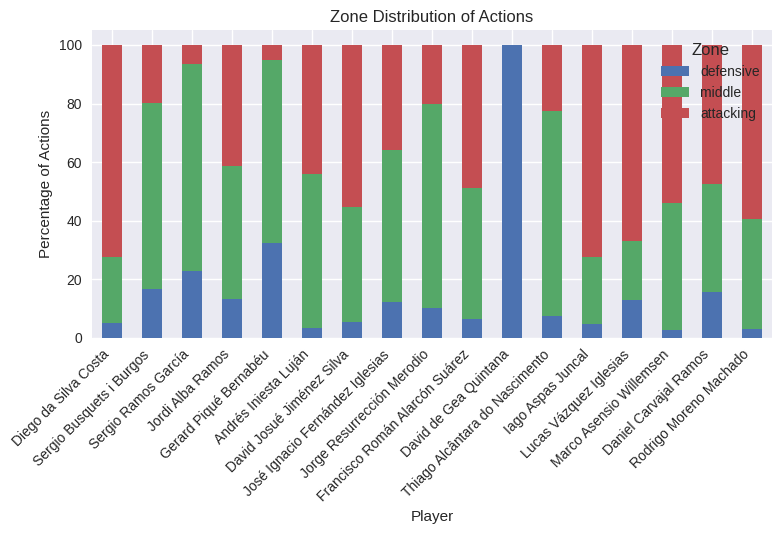

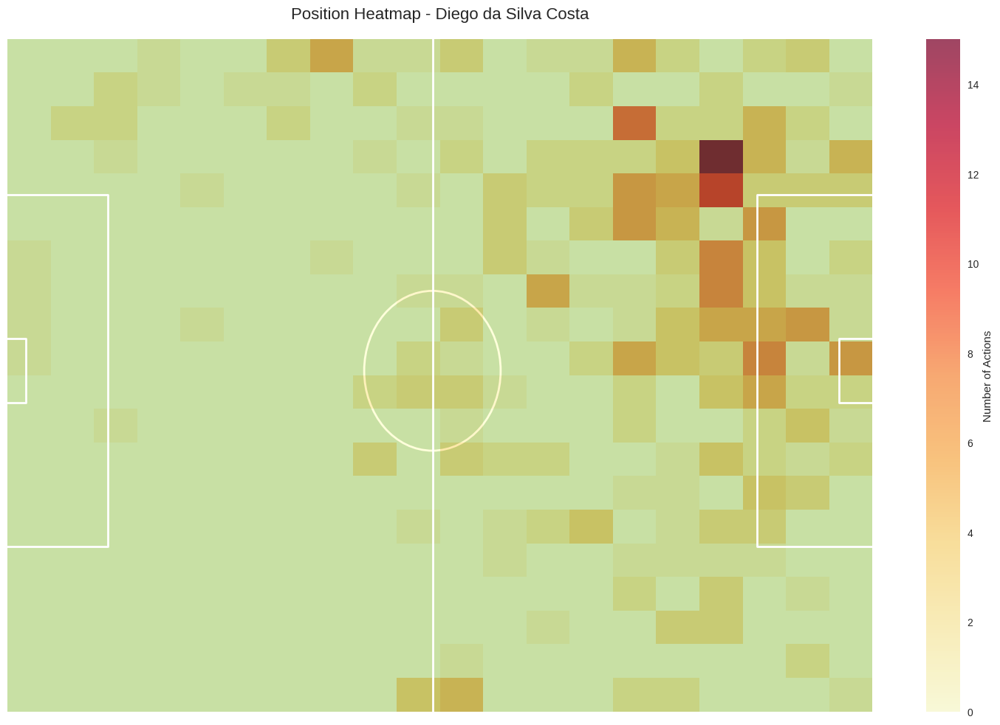

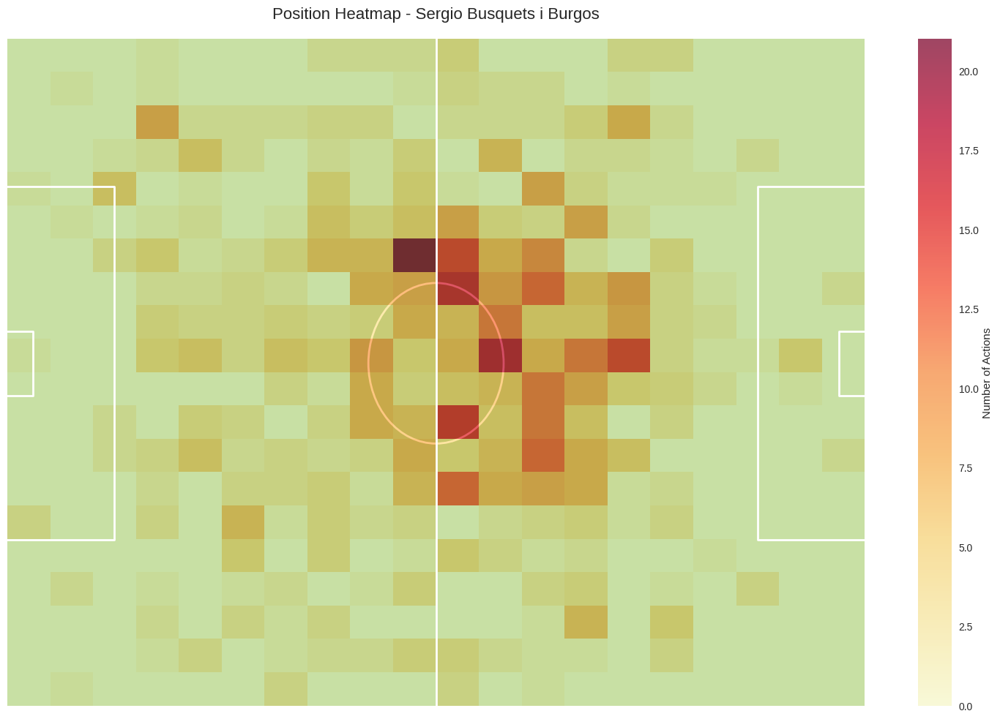

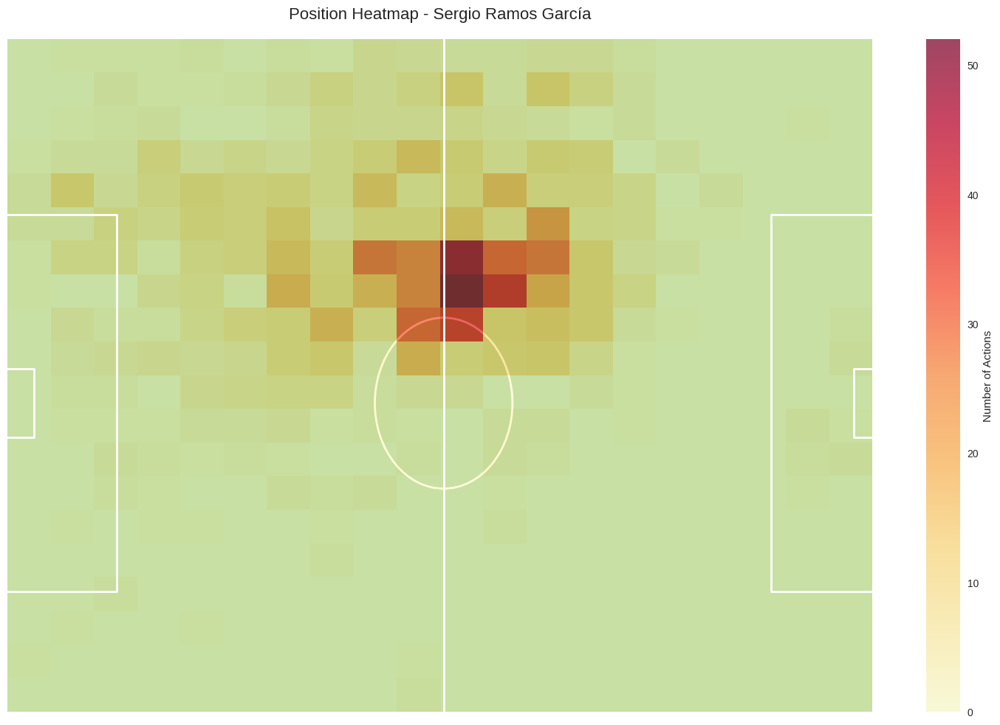

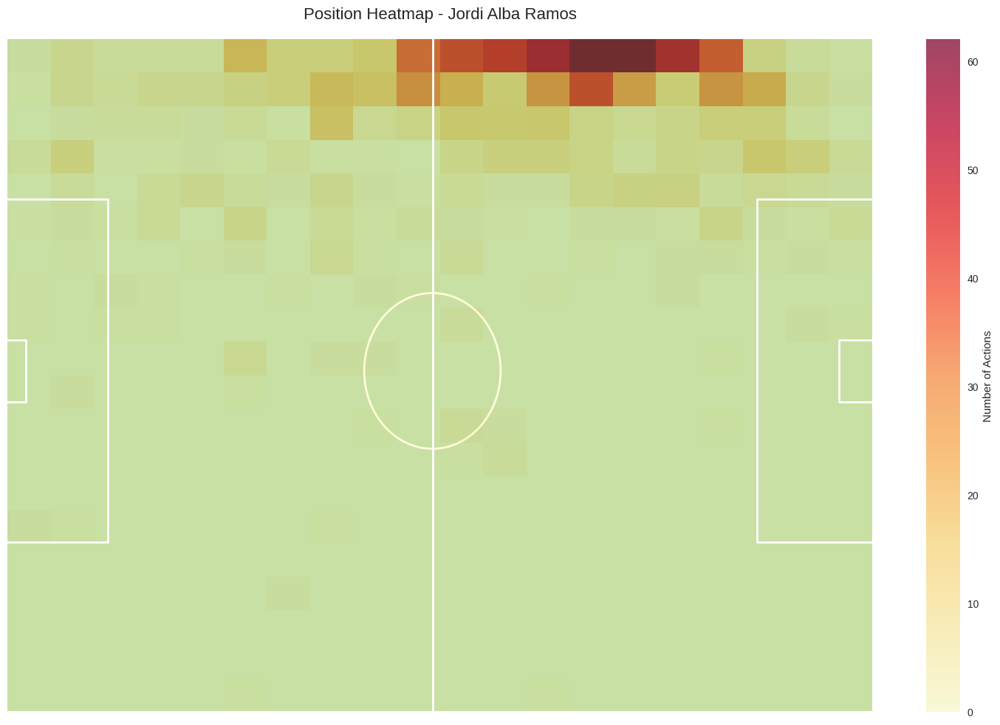

...

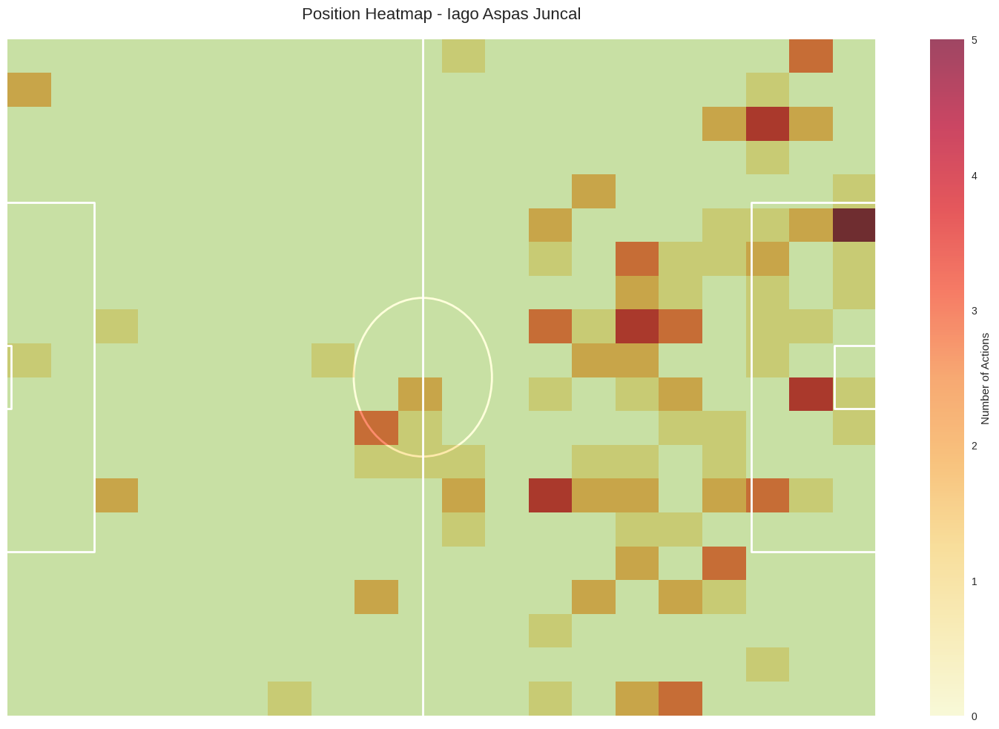

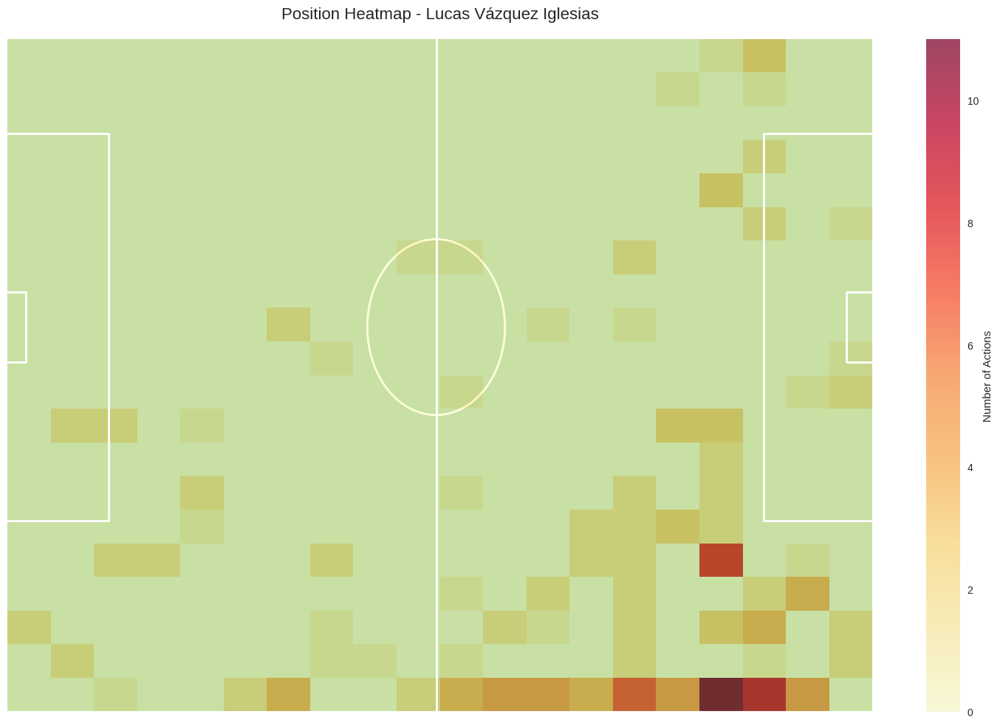

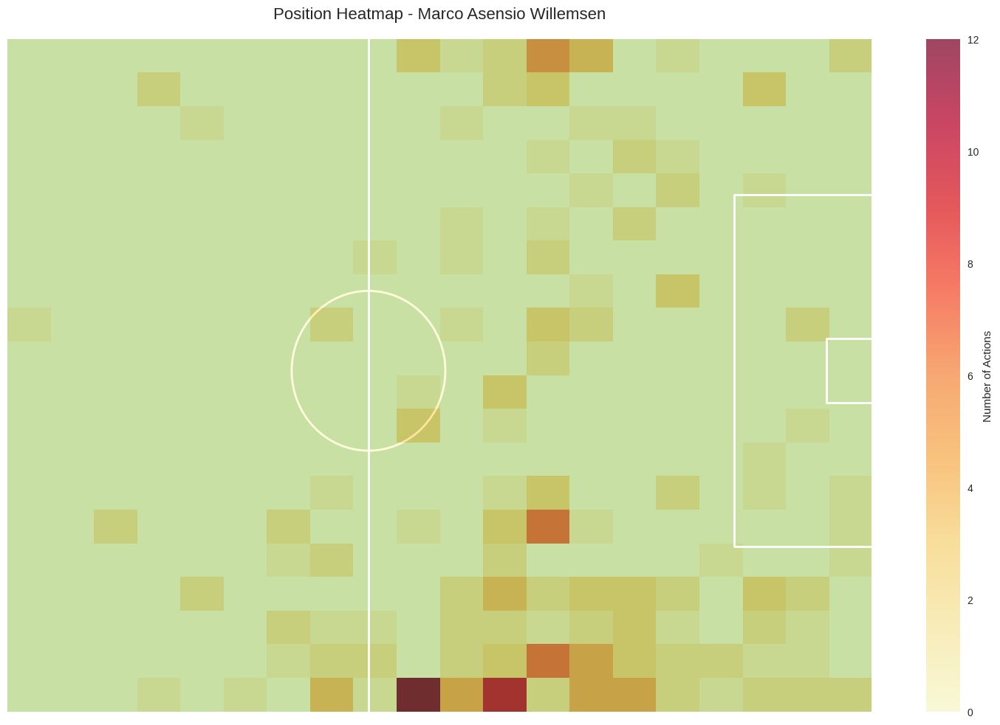

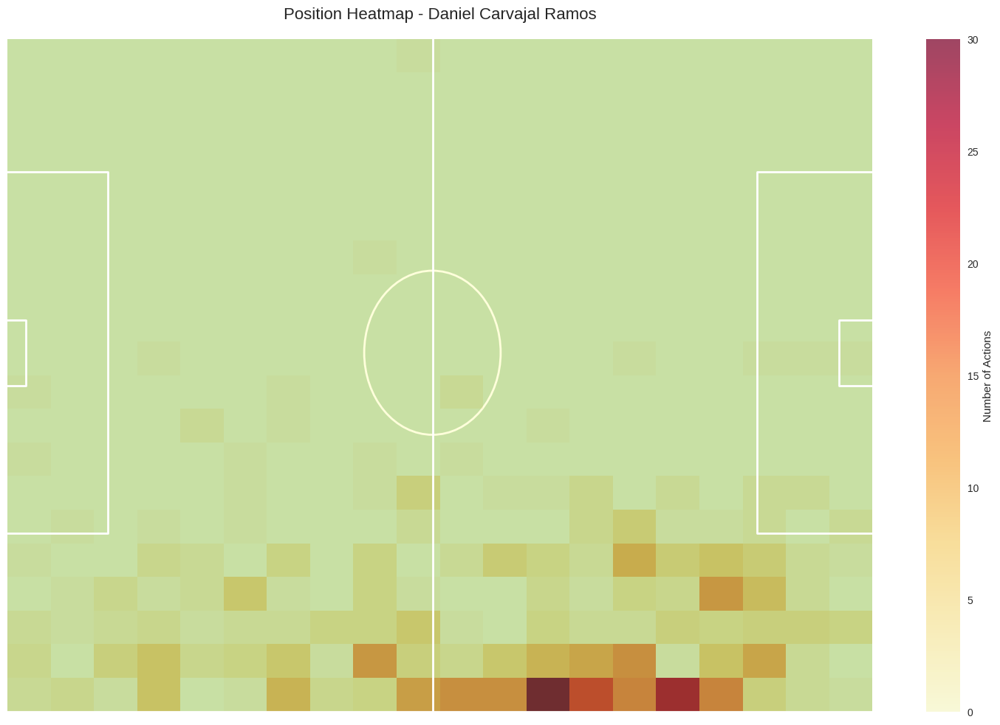

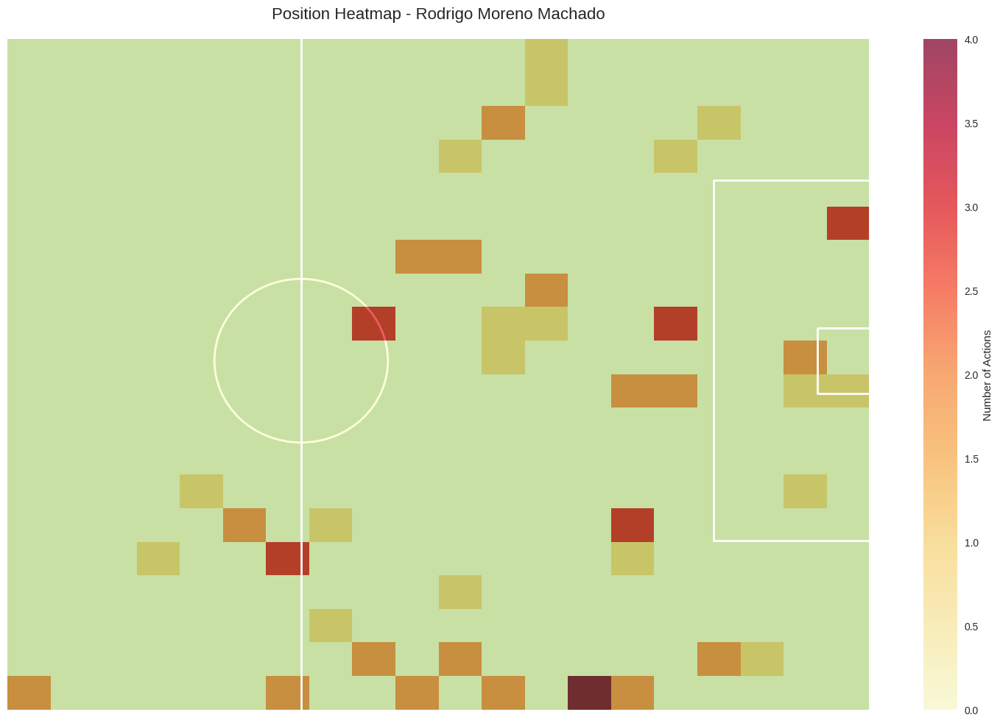

In [13]:
#Player Movement and Positioning Analysis

import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

def analyze_player_movements(events_df, team_name, player_name=None):
    """
    Analyzes player movements and positions based on event locations
    """
    # Filter team events
    team_events = events_df[
        events_df['team'].apply(lambda x: x.get('name') if isinstance(x, dict) else None) == team_name
    ].copy()
    
    # Filter specific player if provided
    if player_name:
        team_events = team_events[
            team_events['player'].apply(lambda x: x.get('name') if isinstance(x, dict) else None) == player_name
        ]
    
    # Extract locations and create movement analysis
    player_actions = {}
    
    for _, event in team_events.iterrows():
        try:
            if isinstance(event['player'], dict):
                player = event['player'].get('name')
                event_type = event['type'].get('name') if isinstance(event['type'], dict) else None
                
                if player not in player_actions:
                    player_actions[player] = {
                        'locations': [],
                        'action_types': [],
                        'zones': {
                            'defensive': 0,
                            'middle': 0,
                            'attacking': 0
                        }
                    }
                
                # Get event location
                if 'location' in event and isinstance(event['location'], list):
                    x, y = event['location']
                    player_actions[player]['locations'].append((x, y))
                    player_actions[player]['action_types'].append(event_type)
                    
                    # Classify zone (simple third-based classification)
                    if x < 40:  # Defensive third
                        player_actions[player]['zones']['defensive'] += 1
                    elif x < 80:  # Middle third
                        player_actions[player]['zones']['middle'] += 1
                    else:  # Attacking third
                        player_actions[player]['zones']['attacking'] += 1
                
        except Exception as e:
            continue
    
    return player_actions

def create_player_heatmap(locations, title="Player Position Heatmap"):
    """
    Creates a heatmap of player positions on the pitch
    """
    plt.figure(figsize=(15, 10))
    
    # Create pitch
    ax = plt.gca()
    create_pitch(ax)
    
    # Convert locations to x and y coordinates
    x_coords = [loc[0] for loc in locations]
    y_coords = [80 - loc[1] for loc in locations]  # Invert y-coordinates
    
    # Create heatmap
    plt.hist2d(x_coords, y_coords, bins=20, cmap='YlOrRd', alpha=0.7)
    plt.colorbar(label='Number of Actions')
    
    plt.title(title, size=16, pad=20)
    plt.tight_layout()
    plt.show()

def analyze_action_distribution(player_actions):
    """
    Analyzes the distribution of different types of actions
    """
    action_types = {}
    
    for player, data in player_actions.items():
        if len(data['action_types']) > 0:
            action_count = pd.Series(data['action_types']).value_counts()
            action_types[player] = action_count
    
    return pd.DataFrame(action_types).fillna(0)

def visualize_zone_distribution(player_actions):
    """
    Visualizes the distribution of actions across different zones
    """
    zone_data = {}
    
    for player, data in player_actions.items():
        zone_data[player] = data['zones']
    
    df_zones = pd.DataFrame(zone_data).T
    
    # Calculate percentages
    df_zones_pct = df_zones.div(df_zones.sum(axis=1), axis=0) * 100
    
    # Plot
    plt.figure(figsize=(12, 6))
    df_zones_pct.plot(kind='bar', stacked=True)
    plt.title('Zone Distribution of Actions')
    plt.xlabel('Player')
    plt.ylabel('Percentage of Actions')
    plt.legend(title='Zone')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

def analyze_player_involvement(player_actions):
    """
    Analyzes player involvement in different phases of play
    """
    involvement_stats = {}
    
    for player, data in player_actions.items():
        total_actions = len(data['locations'])
        if total_actions > 0:
            involvement_stats[player] = {
                'total_actions': total_actions,
                'zone_distribution': data['zones'],
                'action_variety': len(set(data['action_types'])),
                'avg_x_position': np.mean([loc[0] for loc in data['locations']]),
                'avg_y_position': np.mean([loc[1] for loc in data['locations']])
            }
    
    return pd.DataFrame.from_dict(involvement_stats, orient='index')

if __name__ == '__main__':
    # Load data
    events_df = load_matches()
    
    team_name = "Spain"
    player_name = None  # Set to None to analyze all players
    
    # Analyze player movements
    player_actions = analyze_player_movements(events_df, team_name, player_name)
    
    # Display overall involvement statistics
    involvement_stats = analyze_player_involvement(player_actions)
    print("\nPlayer Involvement Statistics:")
    print(involvement_stats)
    
    # Analyze action distribution
    action_dist = analyze_action_distribution(player_actions)
    print("\nAction Type Distribution:")
    print(action_dist)
    
    # Visualize zone distribution
    visualize_zone_distribution(player_actions)
    
    # Create heatmaps for specific players
    for player, data in player_actions.items():
        if len(data['locations']) > 10:  # Only create heatmap if enough data points
            create_player_heatmap(data['locations'], 
                                title=f"Position Heatmap - {player}")

## Code Explanation

This script focuses on opponent and defensive analysis for a specific team (e.g., Spain) using match event data. It extracts and aggregates defensive actions—such as pressures, interceptions, blocks, clearances, duels won, and fouls—from the event dataset and then visualizes pressing patterns on the pitch.

### 1. Analyzing Defensive Actions
- **Function:** `analyze_defensive_actions(events_df, team_name)`
  - **Purpose:**  
    To filter and count defensive events for the specified team.
  - **Process:**
    - Filters events where the team matches `team_name` and the event type is one of: Pressure, Interception, Block, Clearance, Duel, Foul Committed, or Shield.
    - Iterates through these events and, for each player involved, updates counts for:
      - Pressures (and records their locations for spatial analysis),
      - Interceptions,
      - Blocks,
      - Clearances,
      - Duels won (only when the duel outcome is "Won"),
      - Fouls committed.
  - **Output:**  
    Returns a dictionary (`defensive_stats`) containing defensive counts per player and a list of `pressure_locations` for further spatial visualization.

### 2. Visualizing the Pressure Map
- **Function:** `visualize_pressure_map(pressure_locations, title="Pressure Map")`
  - **Purpose:**  
    To create a heatmap showing where defensive pressures occur on the pitch.
  - **Process:**
    - Draws a football pitch background using the `create_pitch(ax)` function.
    - Extracts the x and y coordinates from the `pressure_locations` list (inverting the y-coordinates to align with the pitch orientation).
    - Uses a 2D histogram (`plt.hist2d`) with a specified colormap to visualize areas with a high frequency of pressing actions.
    - Adds a colorbar to indicate the number of pressing actions.
  - **Output:**  
    Displays a heatmap titled accordingly.

### 3. Displaying Defensive Statistics
- **Function:** `display_defensive_stats(defensive_stats)`
  - **Purpose:**  
    To present the aggregated defensive metrics in a clear tabular format.
  - **Process:**
    - Converts the `defensive_stats` dictionary into a Pandas DataFrame.
    - Computes a `total_actions` column by summing all defensive actions per player.
    - Sorts the DataFrame by total actions in descending order.
    - Prints the top 10 defensive contributors.
  - **Output:**  
    A printed DataFrame showing key defensive statistics for players.

### 4. Analyzing Team Pressing Patterns
- **Function:** `analyze_team_pressing(events_df, team_name)`
  - **Purpose:**  
    To examine pressing triggers and patterns for the team.
  - **Process:**
    - Filters the events DataFrame for "Pressure" events by the specified team.
    - Iterates through the filtered events and evaluates pressing triggers:
      - **After Loss:** Increments the counter if a pressure event follows immediately after an event from the same team that is then followed by an opponent's event.
      - **Sideline Press:** Increments if the event's y-coordinate indicates the action took place near the sidelines (y < 10 or y > 70).
    - (An 'opponent_back_pass' trigger is defined but not actively updated.)
  - **Output:**  
    Returns a dictionary (`pressing_triggers`) with counts of each pressing trigger type.

### 5. Main Workflow
- **Data Loading:**  
  The script calls `load_matches()` (assumed to be defined elsewhere) to load and concatenate match event data into a DataFrame.
- **Team Selection:**  
  The team for analysis is set to "Spain".
- **Defensive Analysis:**  
  - Calls `analyze_defensive_actions` to gather defensive stats and pressure locations.
  - Uses `display_defensive_stats` to print the top defensive contributors.
- **Pressing Pattern Analysis:**  
  - Calls `analyze_team_pressing` to count pressing triggers and prints the results.
- **Visualization:**  
  Finally, `visualize_pressure_map` is used to create a heatmap of pressing locations on the pitch.

Overall, this script provides valuable insights into a team's defensive performance by quantifying individual defensive contributions and highlighting spatial patterns in pressing actions.


Processing 7541.json...
Processing 7534.json...
Processing 23.json...
Processing 4.json...
Processing 8652.json...
Processing 7584.json...
Processing 7583.json...
Processing 7530.json...
Processing 7537.json...
Processing 40.json...
Processing 7561.json...
Processing 38.json...
Processing 8656.json...
Processing 26.json...
Processing 2.json...
Processing 7548.json...
Processing 42.json...
Processing 7568.json...
Processing 7525.json...
Processing 3.json...
Processing 7555.json...
Processing 7533.json...
Processing 8649.json...
Processing 7576.json...
Processing 7565.json...
Processing 37.json...
Processing 7553.json...
Processing 22.json...
Processing 39.json...
Processing 7586.json...
Processing 7556.json...
Processing 7544.json...
Processing 7582.json...
Processing 8657.json...
Processing 7577.json...
Processing 25.json...
Processing 8655.json...
Processing 7580.json...
Processing 7560.json...
Processing 7579.json...
Processing 7543.json...
Processing 8658.json...
Processing 7572.jso

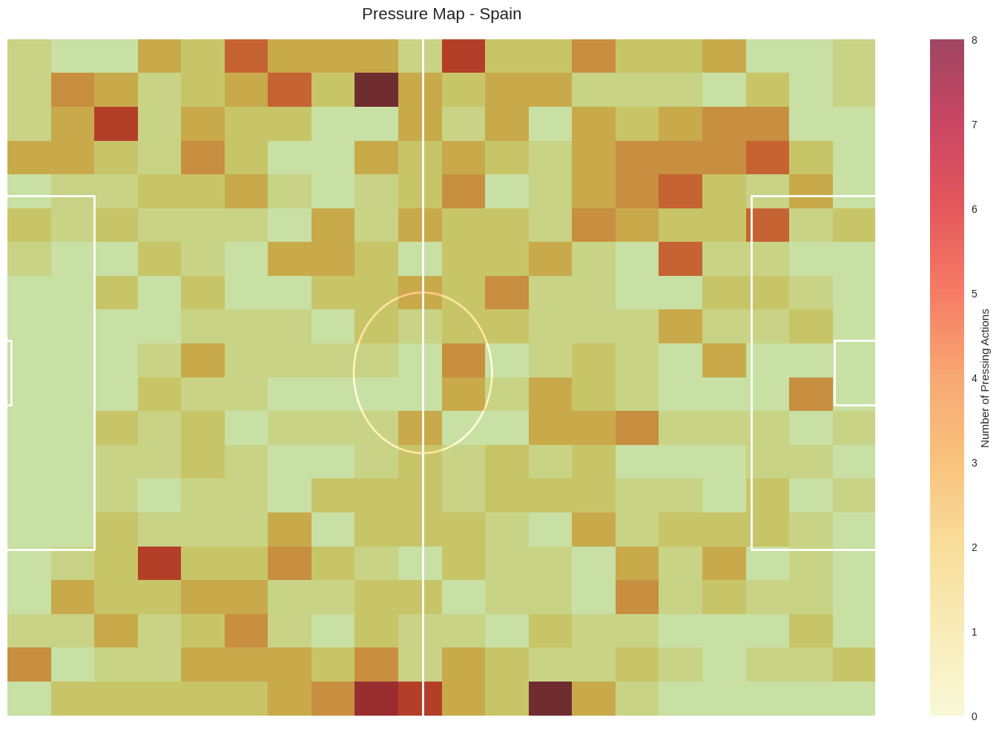

In [14]:
#Opponent and Defensive Analysis
import json
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from pathlib import Path

def analyze_defensive_actions(events_df, team_name):
    """
    Analyzes defensive actions, pressing, and positioning for a team
    """
    # Filter defensive events
    defensive_events = events_df[
        (events_df['team'].apply(lambda x: x.get('name') if isinstance(x, dict) else None) == team_name) &
        (events_df['type'].apply(lambda x: x.get('name') if isinstance(x, dict) else None).isin([
            'Pressure', 'Interception', 'Block', 'Clearance', 'Duel', 'Foul Committed', 'Shield'
        ]))
    ].copy()
    
    print(f"\nDefensive actions for {team_name}: {len(defensive_events)}")
    
    # Create dictionary to store player defensive stats
    defensive_stats = {}
    pressure_locations = []
    
    for _, event in defensive_events.iterrows():
        try:
            if isinstance(event['player'], dict):
                player = event['player'].get('name')
                event_type = event['type'].get('name') if isinstance(event['type'], dict) else None
                
                # Initialize player stats if not exists
                if player not in defensive_stats:
                    defensive_stats[player] = {
                        'pressures': 0,
                        'interceptions': 0,
                        'blocks': 0,
                        'clearances': 0,
                        'duels_won': 0,
                        'fouls': 0
                    }
                
                # Update stats based on event type
                if event_type == 'Pressure':
                    defensive_stats[player]['pressures'] += 1
                    if 'location' in event:
                        pressure_locations.append(event['location'])
                elif event_type == 'Interception':
                    defensive_stats[player]['interceptions'] += 1
                elif event_type == 'Block':
                    defensive_stats[player]['blocks'] += 1
                elif event_type == 'Clearance':
                    defensive_stats[player]['clearances'] += 1
                elif event_type == 'Duel' and event.get('duel', {}).get('outcome', {}).get('name') == 'Won':
                    defensive_stats[player]['duels_won'] += 1
                elif event_type == 'Foul Committed':
                    defensive_stats[player]['fouls'] += 1
                
        except Exception as e:
            continue
    
    return defensive_stats, pressure_locations

def visualize_pressure_map(pressure_locations, title="Pressure Map"):
    """
    Creates a heatmap of pressing locations
    """
    plt.figure(figsize=(15, 10))
    
    # Create pitch
    ax = plt.gca()
    create_pitch(ax)
    
    # Convert pressure locations to x and y coordinates
    x_coords = [loc[0] for loc in pressure_locations if isinstance(loc, list) and len(loc) >= 2]
    y_coords = [80 - loc[1] for loc in pressure_locations if isinstance(loc, list) and len(loc) >= 2]
    
    # Create heatmap
    plt.hist2d(x_coords, y_coords, bins=20, cmap='YlOrRd', alpha=0.7)
    plt.colorbar(label='Number of Pressing Actions')
    
    plt.title(title, size=16, pad=20)
    plt.tight_layout()
    plt.show()

def display_defensive_stats(defensive_stats):
    """
    Displays defensive statistics for each player
    """
    # Convert to DataFrame for better visualization
    df_stats = pd.DataFrame.from_dict(defensive_stats, orient='index')
    
    # Calculate total defensive actions
    df_stats['total_actions'] = df_stats.sum(axis=1)
    
    # Sort by total actions
    df_stats = df_stats.sort_values('total_actions', ascending=False)
    
    print("\nTop Defensive Contributors:")
    print(df_stats.head(10))
    
    return df_stats

def analyze_team_pressing(events_df, team_name):
    """
    Analyzes team pressing patterns and triggers
    """
    # Filter pressing events
    press_events = events_df[
        (events_df['team'].apply(lambda x: x.get('name') if isinstance(x, dict) else None) == team_name) &
        (events_df['type'].apply(lambda x: x.get('name') if isinstance(x, dict) else None) == 'Pressure')
    ].copy()
    
    # Analyze pressing triggers
    pressing_triggers = {
        'after_loss': 0,  # Pressing within 5 seconds of losing possession
        'opponent_back_pass': 0,  # Pressing after opponent back pass
        'sideline_press': 0  # Pressing near sidelines
    }
    
    prev_possession_team = None
    for idx, event in press_events.iterrows():
        try:
            # Check if press occurred after losing possession
            if idx > 0:
                prev_event = events_df.iloc[idx-1]
                prev_team = prev_event['team'].get('name') if isinstance(prev_event['team'], dict) else None
                if prev_team == team_name and prev_team != event['team'].get('name'):
                    pressing_triggers['after_loss'] += 1
            
            # Check if press occurred near sidelines
            if 'location' in event and isinstance(event['location'], list):
                x, y = event['location']
                if y < 10 or y > 70:  # Near sidelines
                    pressing_triggers['sideline_press'] += 1
            
        except Exception as e:
            continue
    
    return pressing_triggers

if __name__ == '__main__':
    # Load data
    events_df = load_matches()
    
    team_name = "Spain"
    
    # Analyze defensive actions
    defensive_stats, pressure_locations = analyze_defensive_actions(events_df, team_name)
    
    # Display defensive statistics
    df_stats = display_defensive_stats(defensive_stats)
    
    # Analyze pressing patterns
    pressing_triggers = analyze_team_pressing(events_df, team_name)
    print("\nPressing Triggers Analysis:")
    for trigger, count in pressing_triggers.items():
        print(f"{trigger}: {count}")
    
    # Visualize pressure map
    visualize_pressure_map(pressure_locations, title=f"Pressure Map - {team_name}")

## Code Explanation

This script performs a comprehensive analysis of individual player movement, pressure, and interaction on the soccer field. It visualizes various aspects of a player's actions using multiple techniques (heatmaps, movement arrows, and pass trajectories) over a custom-drawn soccer field. The analysis is designed to provide insights into where a player is most active, how they move across the pitch, how often they come under pressure, and how they interact with teammates.

### Key Components

1. **Field Drawing and Styling**
   - **Constants:**  
     The script defines constant colors and styles for the visualization, including:
     - `BACKGROUND_COLOR`: Dark green (overall background).
     - `FIELD_COLOR`: Medium green (field area).
     - `LINE_COLOR`: White (for field lines).
     - `HEATMAP_CMAP`: A red-yellow-green color palette for heatmaps.
   - **Function:** `draw_soccer_field(ax)`
     - Draws the soccer field using Matplotlib patches.
     - Adds the field background, boundaries, penalty areas, goal areas, and center circle.
     - Sets the field dimensions (120x80) and styles the lines accordingly.

2. **Retrieving Player Data**
   - **Function:** `get_player_events(events_df, player_name)`
     - Filters the events DataFrame to retrieve all events related to the specified player.
   - **Function:** `get_location_data(events_df, player_name)`
     - Extracts the location coordinates from the player’s events and returns them as a NumPy array.

3. **Heatmap of Player Positions**
   - **Function:** `plot_basic_heatmap(events_df, player_name, ax)`
     - Uses the player’s location data to create a 2D histogram (heatmap) showing areas of high activity.
     - Applies a Gaussian filter to smooth the heatmap.
     - Overlays the heatmap on the soccer field drawing.

4. **Movement Analysis**
   - **Function:** `plot_movement_analysis(events_df, player_name, ax)`
     - Retrieves sequential location data for the player.
     - Draws arrows between consecutive locations to illustrate the direction and magnitude of movements.
     - Marks the starting points with small circles to emphasize movement trajectories.

5. **Pressure Analysis**
   - **Function:** `plot_pressure_analysis(events_df, player_name, ax)`
     - Extracts events where the player was marked as “under_pressure.”
     - Plots red markers at the locations of these events.
     - Additionally, generates a heatmap to visualize areas where the player frequently faced pressure.

6. **Team Interaction Analysis**
   - **Function:** `plot_team_interaction(events_df, player_name, ax)`
     - Focuses on pass events involving the player.
     - Draws lines from the start to the end locations of each pass.
     - Colors the pass lines green for successful passes and red for incomplete ones.
     - Displays a pass success rate on the field, providing insight into the effectiveness of the player’s passing.

7. **Advanced Analysis Layout**
   - **Function:** `plot_advanced_analysis(events_df, player_name)`
     - Creates a composite figure using a 2x2 grid layout.
     - Each subplot displays one of the analyses: basic heatmap, movement direction, pressure actions, and team interaction.
     - Sets an overall title indicating that the analysis is for the specified player.

8. **Player Information and Analysis Execution**
   - **Function:** `get_player_info(events_df, player_name)`
     - Retrieves basic information (team and position) about the player from their events.
   - **Function:** `analyze_player(events_df, player_name)`
     - Prints the player's team and position.
     - Calls `plot_advanced_analysis` to generate the multi-faceted visualization.
     - Displays the resulting figure.

9. **Data Loading and Running the Analysis**
   - The script loads the event data for a specific match (match ID '7530') from a JSON file.
   - It then performs the analysis for two players: "Andrew Nabbout" and "Antoine Griezmann".
   - For each player, the analysis generates separate detailed visualizations that summarize their positional heatmap, movement paths, pressure situations, and passing interactions.

Overall, this script offers a detailed, multi-dimensional view of player behavior on the field, providing valuable insights into individual movement patterns and on-field interactions.


Analyzing player: Andrew Nabbout
Team: Australia
Position: Center Forward


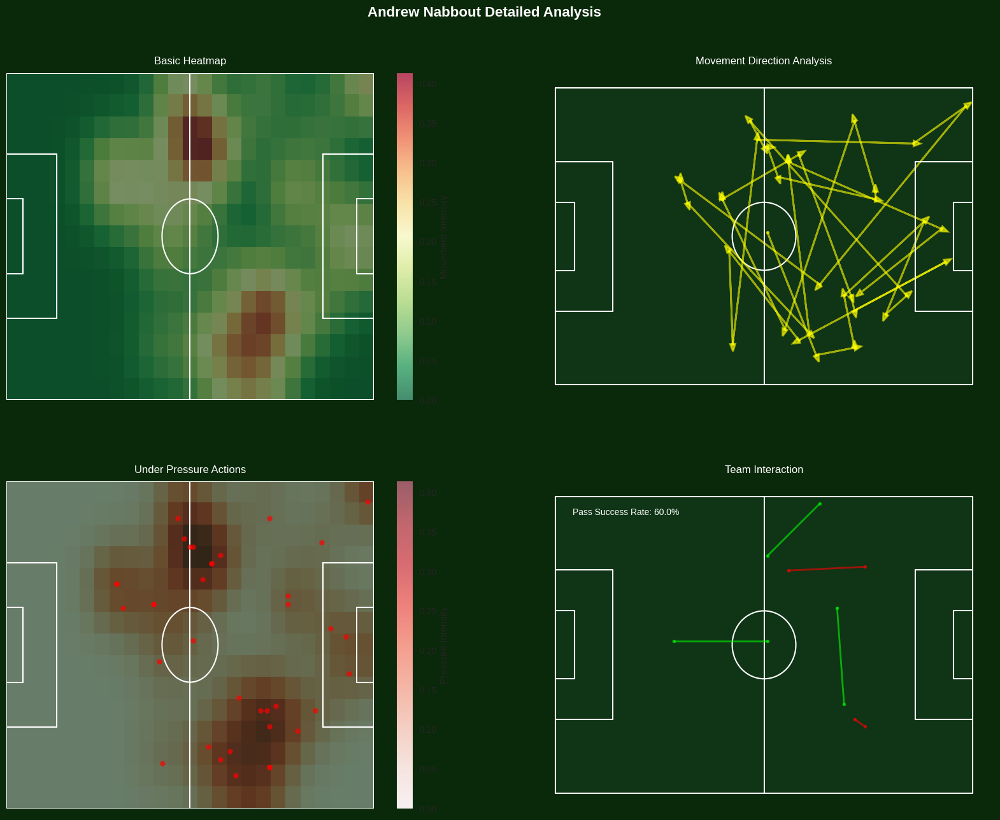

Analyzing player: Antoine Griezmann
Team: France
Position: Center Forward


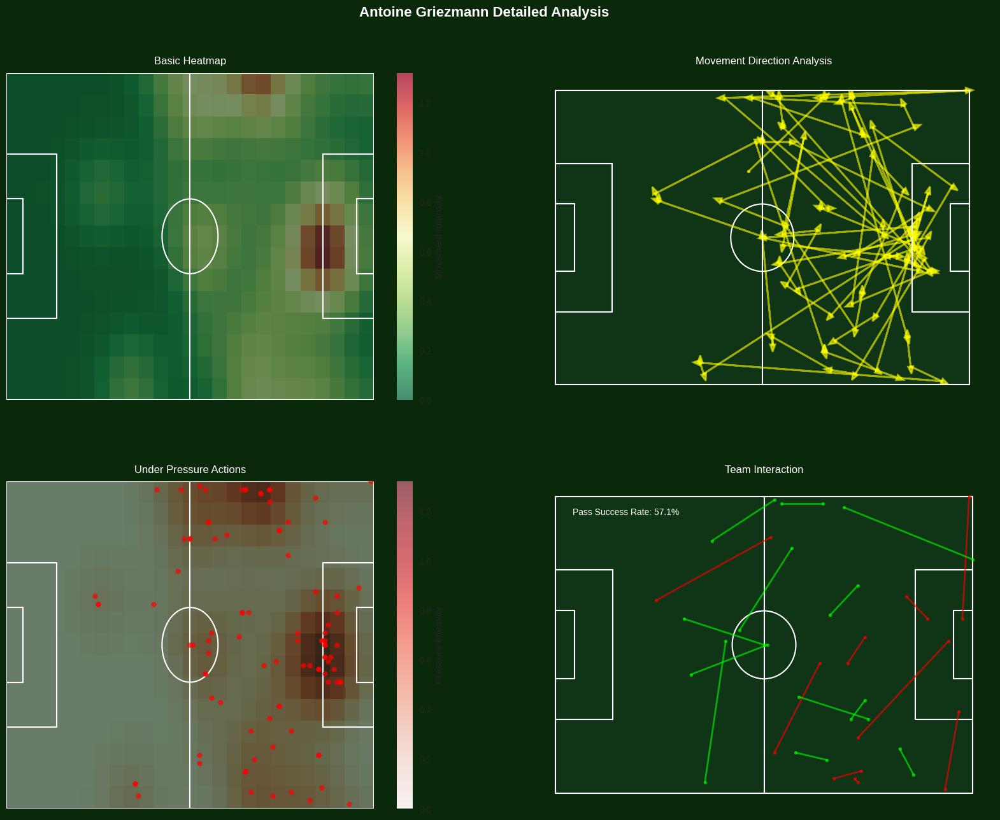

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle, Arc, Arrow
import seaborn as sns
from scipy.ndimage import gaussian_filter
import warnings
warnings.filterwarnings('ignore')

# Constant colors and styles
BACKGROUND_COLOR = '#0a280a'  # Dark green
FIELD_COLOR = '#1a472a'      # Medium green
LINE_COLOR = '#ffffff'       # White
HEATMAP_CMAP = 'RdYlGn_r'    # Red-Yellow-Green palette

def draw_soccer_field(ax):
    """Soccer field drawing function."""
    field_length = 120
    field_width = 80
    
    # Field background
    ax.add_patch(Rectangle((0, 0), field_length, field_width, 
                           facecolor=FIELD_COLOR, alpha=0.4))
    
    # Main lines
    linewidth = 1.5
    ax.plot([0, 0], [0, field_width], LINE_COLOR, linewidth=linewidth)
    ax.plot([0, field_length], [0, 0], LINE_COLOR, linewidth=linewidth)
    ax.plot([field_length, field_length], [0, field_width], LINE_COLOR, linewidth=linewidth)
    ax.plot([0, field_length], [field_width, field_width], LINE_COLOR, linewidth=linewidth)
    ax.plot([field_length/2, field_length/2], [0, field_width], LINE_COLOR, linewidth=linewidth)
    
    # Penalty areas
    ax.plot([16.5, 16.5], [field_width/2-20.15, field_width/2+20.15], LINE_COLOR, linewidth=linewidth)
    ax.plot([field_length-16.5, field_length-16.5], [field_width/2-20.15, field_width/2+20.15], LINE_COLOR, linewidth=linewidth)
    ax.plot([0, 16.5], [field_width/2-20.15, field_width/2-20.15], LINE_COLOR, linewidth=linewidth)
    ax.plot([0, 16.5], [field_width/2+20.15, field_width/2+20.15], LINE_COLOR, linewidth=linewidth)
    ax.plot([field_length-16.5, field_length], [field_width/2-20.15, field_width/2-20.15], LINE_COLOR, linewidth=linewidth)
    ax.plot([field_length-16.5, field_length], [field_width/2+20.15, field_width/2+20.15], LINE_COLOR, linewidth=linewidth)
    
    # Goal areas
    ax.plot([0, 5.5], [field_width/2-9.15, field_width/2-9.15], LINE_COLOR, linewidth=linewidth)
    ax.plot([0, 5.5], [field_width/2+9.15, field_width/2+9.15], LINE_COLOR, linewidth=linewidth)
    ax.plot([5.5, 5.5], [field_width/2-9.15, field_width/2+9.15], LINE_COLOR, linewidth=linewidth)
    ax.plot([field_length-5.5, field_length], [field_width/2-9.15, field_width/2-9.15], LINE_COLOR, linewidth=linewidth)
    ax.plot([field_length-5.5, field_length], [field_width/2+9.15, field_width/2+9.15], LINE_COLOR, linewidth=linewidth)
    ax.plot([field_length-5.5, field_length-5.5], [field_width/2-9.15, field_width/2+9.15], LINE_COLOR, linewidth=linewidth)
    
    # Center circle
    center_circle = plt.Circle((field_length/2, field_width/2), 9.15, 
                               color=LINE_COLOR, fill=False, linewidth=linewidth)
    ax.add_artist(center_circle)

def get_player_events(events_df, player_name):
    """Retrieve all actions for a specific player."""
    return events_df[events_df['player'].apply(
        lambda x: isinstance(x, dict) and x.get('name') == player_name)].to_dict('records')

def get_location_data(events_df, player_name):
    """Retrieve location data."""
    events = get_player_events(events_df, player_name)
    locations = []
    for event in events:
        if isinstance(event.get('location'), list):
            locations.append(event['location'])
    return np.array(locations)

def plot_basic_heatmap(events_df, player_name, ax):
    """Basic heatmap."""
    ax.set_facecolor(BACKGROUND_COLOR)
    locations = get_location_data(events_df, player_name)
    
    draw_soccer_field(ax)
    
    if len(locations) > 0:
        heatmap, xedges, yedges = np.histogram2d(
            locations[:, 0], locations[:, 1], 
            bins=(25, 15),
            range=[[0, 120], [0, 80]]
        )
        heatmap = gaussian_filter(heatmap, sigma=1.5)
        
        im = plt.imshow(heatmap.T, extent=[0, 120, 0, 80], origin='lower',
                        cmap=HEATMAP_CMAP, aspect='auto', alpha=0.7)
        
        plt.colorbar(im, ax=ax, label='Movement Intensity')
    
    plt.title("Basic Heatmap", color='white', pad=10)
    plt.axis('off')

def plot_movement_analysis(events_df, player_name, ax):
    """Movement analysis."""
    ax.set_facecolor(BACKGROUND_COLOR)
    draw_soccer_field(ax)
    
    locations = get_location_data(events_df, player_name)
    if len(locations) > 1:
        for i in range(len(locations) - 1):
            dx = locations[i+1][0] - locations[i][0]
            dy = locations[i+1][1] - locations[i][1]
            
            # Movement arrow
            ax.arrow(locations[i][0], locations[i][1], dx, dy,
                     head_width=1.5, head_length=2, 
                     fc='yellow', ec='yellow', alpha=0.6,
                     linewidth=2)
            
            # Starting point
            ax.plot(locations[i][0], locations[i][1], 'o', 
                    color='yellow', markersize=4, alpha=0.6)
    
    plt.title("Movement Direction Analysis", color='white', pad=10)
    plt.axis('off')

def plot_pressure_analysis(events_df, player_name, ax):
    """Pressure analysis."""
    ax.set_facecolor(BACKGROUND_COLOR)
    draw_soccer_field(ax)
    
    events = get_player_events(events_df, player_name)
    pressure_locations = []
    
    for event in events:
        if 'under_pressure' in event and event['under_pressure']:
            if isinstance(event['location'], list):
                pressure_locations.append(event['location'])
                # Pressure point
                ax.plot(event['location'][0], event['location'][1], 
                        'ro', markersize=6, alpha=0.7)
    
    if pressure_locations:
        pressure_locations = np.array(pressure_locations)
        heatmap, xedges, yedges = np.histogram2d(
            pressure_locations[:, 0], pressure_locations[:, 1],
            bins=(25, 15),
            range=[[0, 120], [0, 80]]
        )
        heatmap = gaussian_filter(heatmap, sigma=1.5)
        im = plt.imshow(heatmap.T, extent=[0, 120, 0, 80], origin='lower',
                        cmap='Reds', aspect='auto', alpha=0.6)
        plt.colorbar(im, ax=ax, label='Pressure Intensity')
    
    plt.title("Under Pressure Actions", color='white', pad=10)
    plt.axis('off')

def plot_team_interaction(events_df, player_name, ax):
    """Team interaction analysis."""
    ax.set_facecolor(BACKGROUND_COLOR)
    draw_soccer_field(ax)
    
    events = get_player_events(events_df, player_name)
    pass_locations = []
    successful_passes = 0
    total_passes = 0
    
    for event in events:
        if event.get('type', {}).get('name') == 'Pass':
            total_passes += 1
            if (isinstance(event.get('location'), list) and 
                isinstance(event.get('pass', {}).get('end_location'), list)):
                start = event['location']
                end = event['pass']['end_location']
                
                # Differentiate successful/unsuccessful passes
                if event.get('pass', {}).get('outcome', {}).get('name') != 'Incomplete':
                    color = 'lime'
                    successful_passes += 1
                else:
                    color = 'red'
                
                ax.plot([start[0], end[0]], [start[1], end[1]], 
                        color=color, alpha=0.6, linewidth=2,
                        linestyle='-', marker='o', markersize=4)
                pass_locations.extend([start, end])
    
    # Pass statistics
    if total_passes > 0:
        success_rate = successful_passes / total_passes * 100
        ax.text(5, 75, f'Pass Success Rate: {success_rate:.1f}%', 
                color='white', fontsize=10)
    
    plt.title("Team Interaction", color='white', pad=10)
    plt.axis('off')

def plot_advanced_analysis(events_df, player_name):
    """Main analysis function."""
    # Figure creation
    fig = plt.figure(figsize=(20, 15))
    fig.patch.set_facecolor(BACKGROUND_COLOR)
    
    # Title
    plt.suptitle(f'{player_name} Detailed Analysis', 
                 color='white', size=16, y=0.95, fontweight='bold')
    
    # Grid layout
    gs = gridspec.GridSpec(2, 2)
    gs.update(wspace=0.15, hspace=0.25)
    
    # Subplots
    ax1 = plt.subplot(gs[0, 0])
    plot_basic_heatmap(events_df, player_name, ax1)
    
    ax2 = plt.subplot(gs[0, 1])
    plot_movement_analysis(events_df, player_name, ax2)
    
    ax3 = plt.subplot(gs[1, 0])
    plot_pressure_analysis(events_df, player_name, ax3)
    
    ax4 = plt.subplot(gs[1, 1])
    plot_team_interaction(events_df, player_name, ax4)
    
    return fig

def analyze_player(events_df, player_name):
    """Initiate player analysis."""
    team, position = get_player_info(events_df, player_name)
    print(f"Analyzing player: {player_name}")
    print(f"Team: {team}")
    print(f"Position: {position}")
    
    fig = plot_advanced_analysis(events_df, player_name)
    plt.show()
    return fig

def get_player_info(events_df, player_name):
    """Retrieve player information."""
    player_events = events_df[events_df['player'].apply(
        lambda x: isinstance(x, dict) and x.get('name') == player_name)]
    
    if len(player_events) > 0:
        team = player_events.iloc[0]['team']['name']
        position = player_events.iloc[0].get('position', {})
        if isinstance(position, dict):
            position = position.get('name', 'Unknown')
        return team, position
    return 'Unknown', 'Unknown'

# Load data and run analysis
match_id = '7530'
events_df = pd.read_json(f'/kaggle/input/{match_id}.json')

# Analyze players
player1 = "Andrew Nabbout"
player2 = "Antoine Griezmann"

fig1 = analyze_player(events_df, player1)
fig2 = analyze_player(events_df, player2)
